In [58]:
import numpy as np
import scipy

import cupy as cp
import cupyx.scipy

import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
import time

import warnings
warnings.filterwarnings("ignore")

import poppy
import hcipy as hci

import wfsc_tests as wfsc
wfsc.math_module.update_np(np)
wfsc.math_module.update_scipy(scipy)

import misc_funs as misc

import hcipy_models as hcim
reload(hcim)
npix = 128
oversample = 4
c = hcim.SVC(npix=npix, oversample=oversample)

In [59]:
influence_functions = hci.make_gaussian_influence_functions(c.pupil_grid, c.Nact, c.actuator_spacing)


In [73]:
reload(hcim)
c = hcim.SVC(npix=npix, oversample=oversample,
             influence_functions=influence_functions,
             psf_pixelscale_lamD=1/4,
             dm1_dm2=10000*u.mm,
             aberration_distance=500e-3*u.m)

In [74]:
Nact = c.Nact
Nacts = int(c.dm_mask.sum())

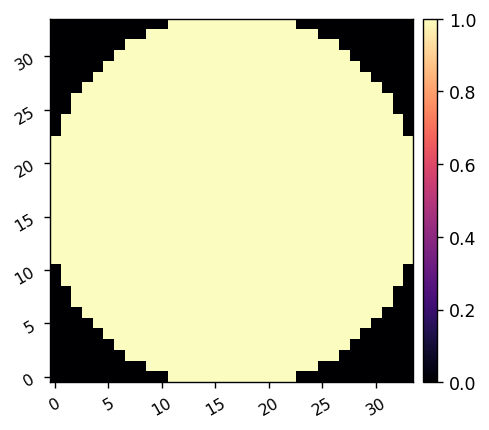

In [75]:
wfsc.imshow1(c.dm_mask)

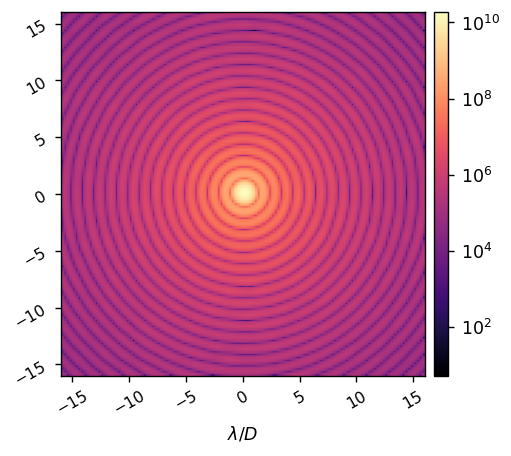

Field(1.86386287e+10)

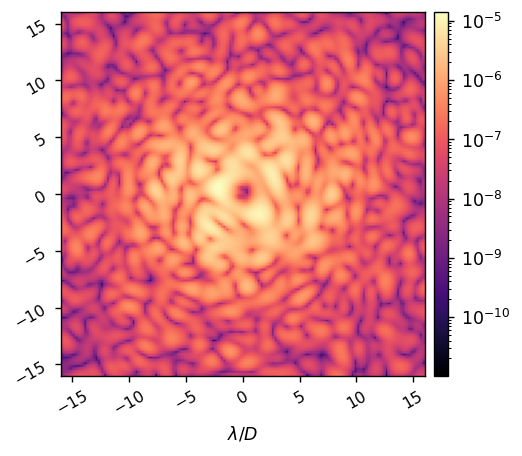

In [76]:
c.use_fpm = False
ref_unocc_im = c.snap()
wfsc.imshows.imshow1(ref_unocc_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

max_ref = ref_unocc_im.max()
display(max_ref)

c.use_fpm = True
c.norm = max_ref # divide the source flux to get nominal contrast images
ref_im = c.snap()
wfsc.imshow1(ref_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

# define the dark hole region

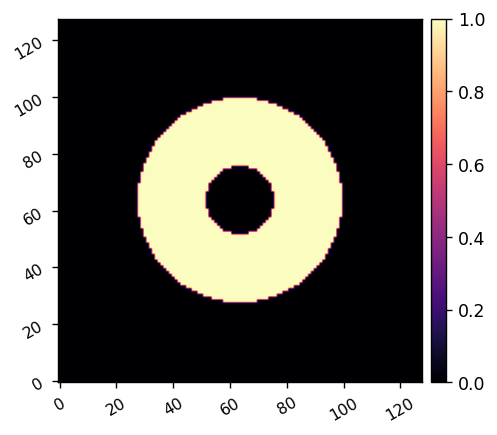

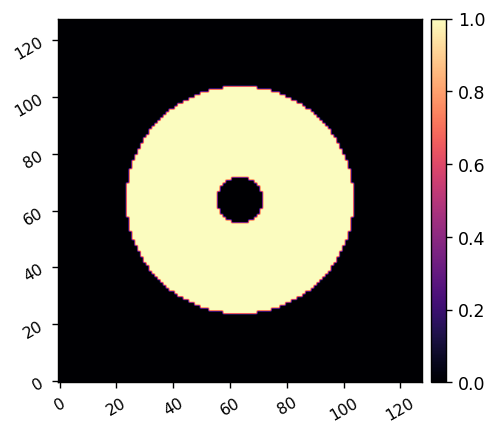

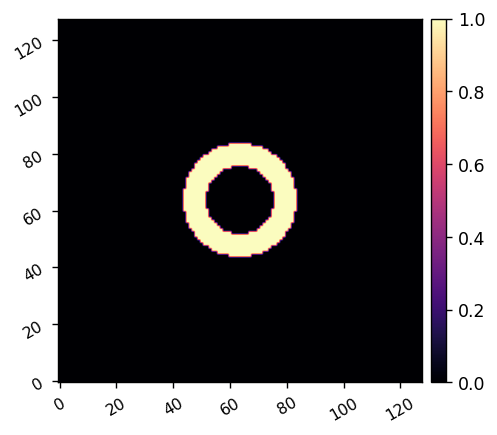

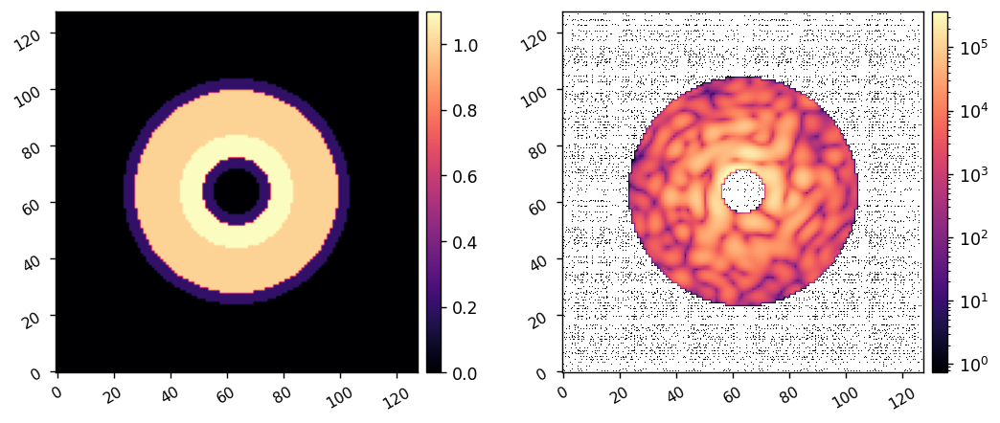

In [79]:
reload(wfsc)
reload(wfsc.utils)
reload(wfsc.imshows)

npsf = c.npsf

xfp = (np.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*c.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)

iwa = 3
owa = 9
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2.5,
        'rotation':0,
        'full':True,
    }
roi1 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = (3-1)
owa = (9+1)
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi2 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


iwa = 3
owa = 5
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi3 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


# wfsc.imshow2(roi1, roi2)
weight_map = roi1 + 0.2*(roi2 * ~roi1) + 0.1*roi3
control_mask = weight_map>0
wfsc.imshow2(weight_map, control_mask*im, lognorm2=True)


(492, 1156)

(246, 2)

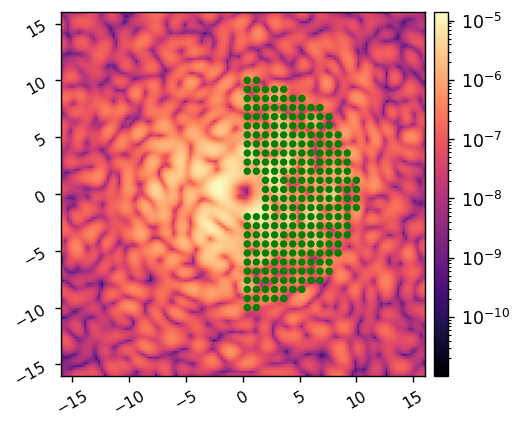

In [80]:
reload(wfsc.utils)
fourier_modes, fs = wfsc.utils.select_fourier_modes(c, control_mask*(fpx>0), fourier_sampling=0.8) 
nmodes = fourier_modes.shape[0]
nf = fourier_modes.shape[0]//2
display(fourier_modes.shape, fs.shape)

patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))
    
wfsc.imshow1(ref_im, lognorm=True, pxscl=c.psf_pixelscale_lamD, patches=patches)

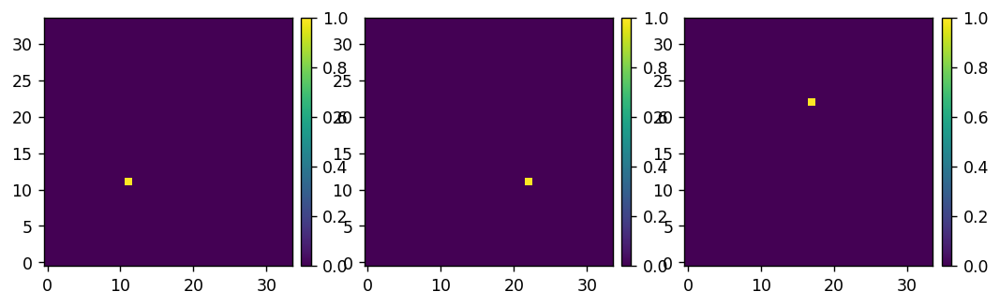

In [81]:
reload(wfsc.utils)
# probe_modes_1 = wfsc.utils.create_fourier_probes(fourier_modes, Nact=34, plot=True)
# probe = 1/np.sqrt(2) * np.sum((fourier_modes[:nf] + fourier_modes[nf:]), axis=0).reshape(Nact,Nact)
# probe /= probe.max()
# wfsc.imshow1(probe)

# probe_modes = np.array([probe_modes_1[0], probe, probe_modes_1[1]])
# wfsc.imshow3(probe_modes[0], probe_modes[1], probe_modes[2])

# probe_modes = wfsc.utils.create_probe_poke_modes(Nact, 
#                                                  poke_indices=[(Nact//5, Nact//2), (Nact//5+1, Nact//2)], 
#                                                  plot=True)

probe_modes = wfsc.utils.create_probe_poke_modes(Nact, 
                                                 poke_indices=[(Nact//3, Nact//3), 
                                                               (2*Nact//3, Nact//3), 
                                                               (Nact//2, 2*Nact//3)], 
                                                 plot=True)


# probe_modes = probe_modes_1 + probe_modes_2

# wfsc.imshow2(probe_modes[0], probe_modes[1])

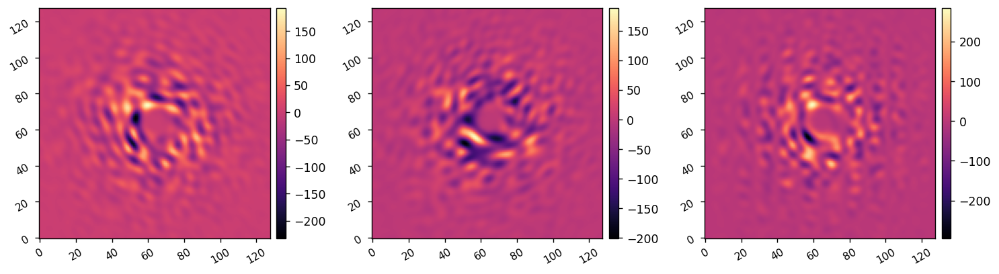

In [82]:
reload(wfsc.iefc_2dm)

probe_amp = 5e-8
calib_amp = 5e-9

# c.texp = 1

c.reset_dms()

differential_images, single_images = wfsc.iefc_2dm.take_measurement(c, 
                                                                   probe_modes, probe_amp, 
                                                                   return_all=True)
ims = differential_images.reshape(3, c.npsf, c.npsf)
wfsc.imshow3(ims[0], ims[1], ims[0]-ims[1], wspace=0.35)

In [83]:
reload(wfsc.iefc_2dm)
response_matrix, response_cube = wfsc.iefc_2dm.calibrate(c, 
                                                         control_mask.ravel(),
                                                         probe_amp, probe_modes, 
                                                         calib_amp, fourier_modes, 
                                                         return_all=True)

Calibrating I-EFC...
	Calibrated mode 1 / 492 in 7.382s
	Calibrated mode 2 / 492 in 14.711s
	Calibrated mode 3 / 492 in 22.051s
	Calibrated mode 4 / 492 in 29.379s
	Calibrated mode 5 / 492 in 36.722s
	Calibrated mode 6 / 492 in 44.049s
	Calibrated mode 7 / 492 in 51.394s
	Calibrated mode 8 / 492 in 58.727s
	Calibrated mode 9 / 492 in 66.055s
	Calibrated mode 10 / 492 in 73.413s
	Calibrated mode 11 / 492 in 80.752s
	Calibrated mode 12 / 492 in 88.097s
	Calibrated mode 13 / 492 in 95.441s
	Calibrated mode 14 / 492 in 102.781s
	Calibrated mode 15 / 492 in 110.130s
	Calibrated mode 16 / 492 in 117.482s
	Calibrated mode 17 / 492 in 124.838s
	Calibrated mode 18 / 492 in 132.209s
	Calibrated mode 19 / 492 in 139.544s
	Calibrated mode 20 / 492 in 146.885s
	Calibrated mode 21 / 492 in 154.228s
	Calibrated mode 22 / 492 in 161.565s
	Calibrated mode 23 / 492 in 168.889s
	Calibrated mode 24 / 492 in 176.227s
	Calibrated mode 25 / 492 in 183.557s
	Calibrated mode 26 / 492 in 190.893s
	Calibrated mo

	Calibrated mode 212 / 492 in 1635.119s
	Calibrated mode 213 / 492 in 1643.102s
	Calibrated mode 214 / 492 in 1651.068s
	Calibrated mode 215 / 492 in 1659.062s
	Calibrated mode 216 / 492 in 1667.091s
	Calibrated mode 217 / 492 in 1675.107s
	Calibrated mode 218 / 492 in 1683.143s
	Calibrated mode 219 / 492 in 1691.182s
	Calibrated mode 220 / 492 in 1699.177s
	Calibrated mode 221 / 492 in 1707.114s
	Calibrated mode 222 / 492 in 1715.070s
	Calibrated mode 223 / 492 in 1722.979s
	Calibrated mode 224 / 492 in 1730.926s
	Calibrated mode 225 / 492 in 1738.855s
	Calibrated mode 226 / 492 in 1746.796s
	Calibrated mode 227 / 492 in 1754.763s
	Calibrated mode 228 / 492 in 1762.712s
	Calibrated mode 229 / 492 in 1770.630s
	Calibrated mode 230 / 492 in 1778.538s
	Calibrated mode 231 / 492 in 1786.425s
	Calibrated mode 232 / 492 in 1794.299s
	Calibrated mode 233 / 492 in 1802.187s
	Calibrated mode 234 / 492 in 1810.051s
	Calibrated mode 235 / 492 in 1817.941s
	Calibrated mode 236 / 492 in 1825.850s


	Calibrated mode 417 / 492 in 3203.597s
	Calibrated mode 418 / 492 in 3211.010s
	Calibrated mode 419 / 492 in 3218.439s
	Calibrated mode 420 / 492 in 3225.865s
	Calibrated mode 421 / 492 in 3233.301s
	Calibrated mode 422 / 492 in 3240.785s
	Calibrated mode 423 / 492 in 3248.193s
	Calibrated mode 424 / 492 in 3255.619s
	Calibrated mode 425 / 492 in 3263.057s
	Calibrated mode 426 / 492 in 3270.522s
	Calibrated mode 427 / 492 in 3277.974s
	Calibrated mode 428 / 492 in 3285.416s
	Calibrated mode 429 / 492 in 3292.873s
	Calibrated mode 430 / 492 in 3300.306s
	Calibrated mode 431 / 492 in 3307.750s
	Calibrated mode 432 / 492 in 3315.206s
	Calibrated mode 433 / 492 in 3322.658s
	Calibrated mode 434 / 492 in 3330.113s
	Calibrated mode 435 / 492 in 3337.565s
	Calibrated mode 436 / 492 in 3345.026s
	Calibrated mode 437 / 492 in 3352.454s
	Calibrated mode 438 / 492 in 3359.900s
	Calibrated mode 439 / 492 in 3367.348s
	Calibrated mode 440 / 492 in 3374.789s
	Calibrated mode 441 / 492 in 3382.228s


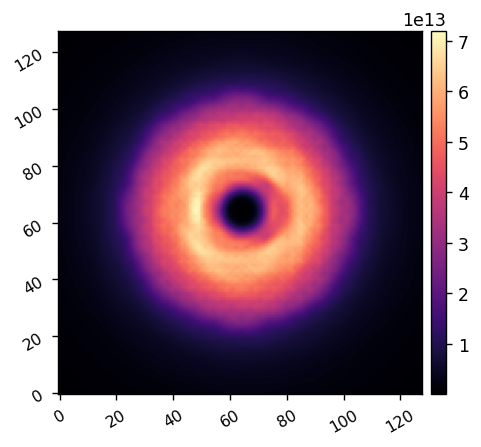

In [84]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.imshow1(response_sum.reshape(c.npsf,c.npsf))

In [71]:
misc.save_fits('hcipy_svc_iefc_2dm_response_matrix_20230525.fits', response_matrix)
misc.save_fits('hcipy_svc_iefc_2dm_response_cube_20230525.fits', response_cube)

Saved data to:  hcipy_svc_iefc_2dm_response_matrix_20230525.fits
Saved data to:  hcipy_svc_iefc_2dm_response_cube_20230525.fits


Running I-EFC...
	Closed-loop iteration 1 / 10


(984,)

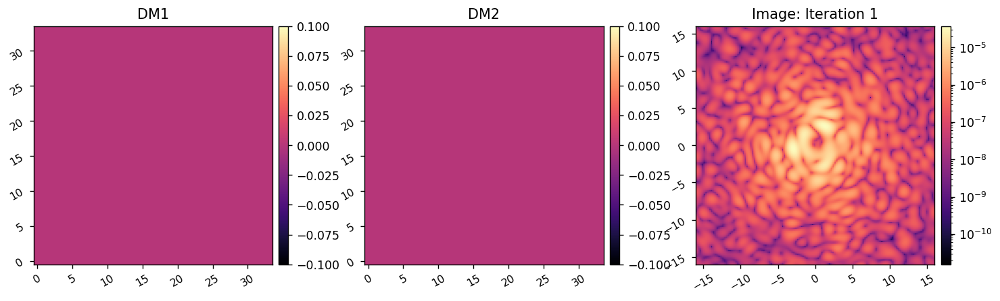

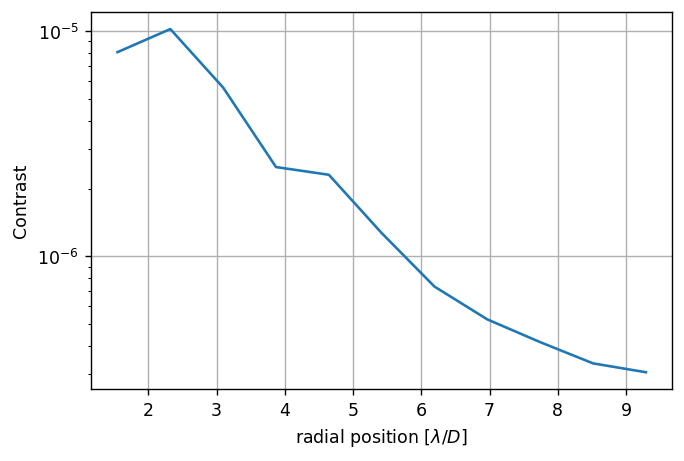

	Closed-loop iteration 2 / 10


(984,)

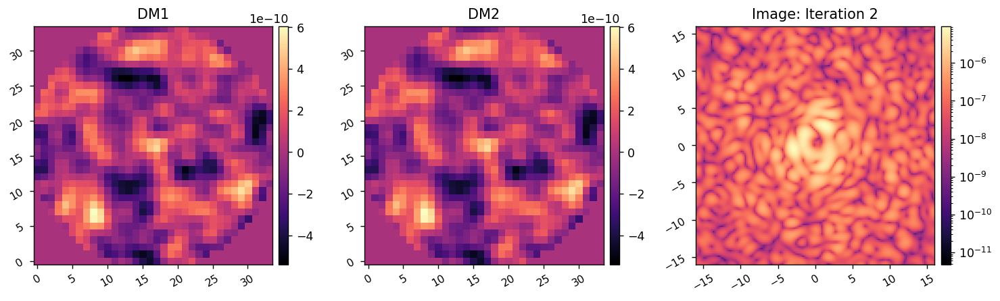

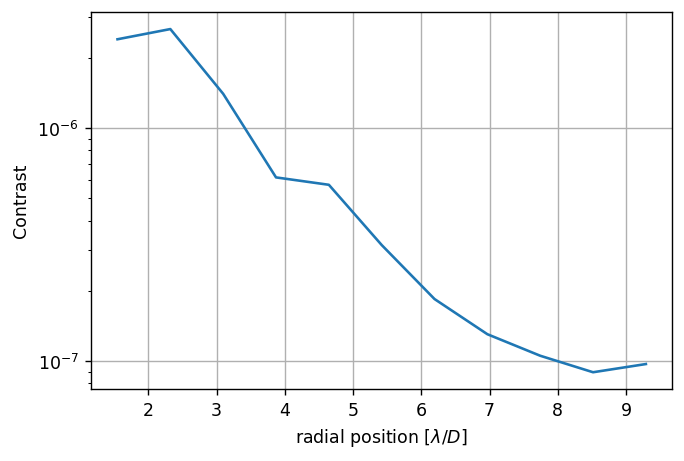

	Closed-loop iteration 3 / 10


(984,)

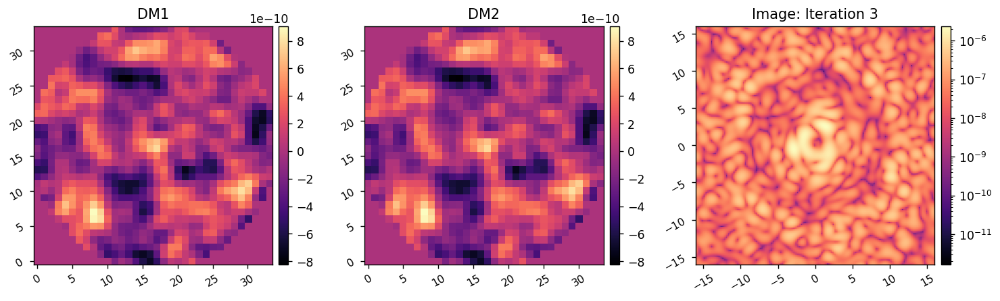

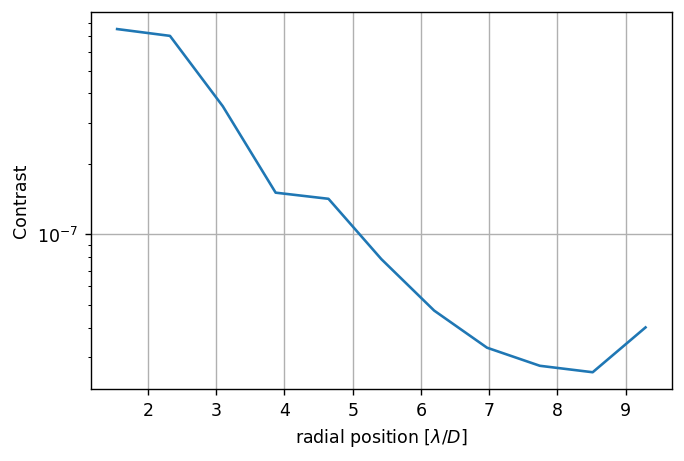

	Closed-loop iteration 4 / 10


(984,)

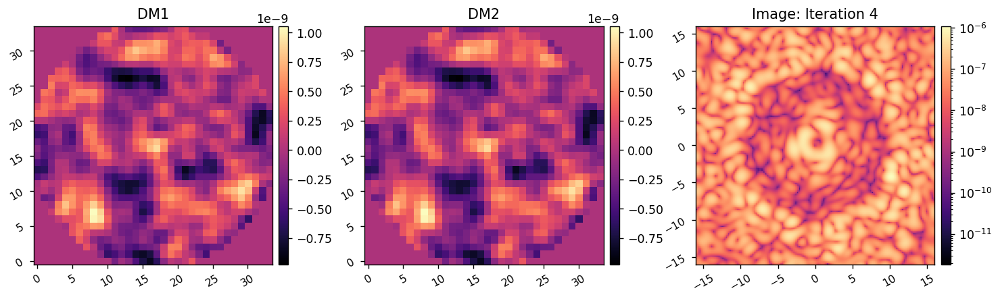

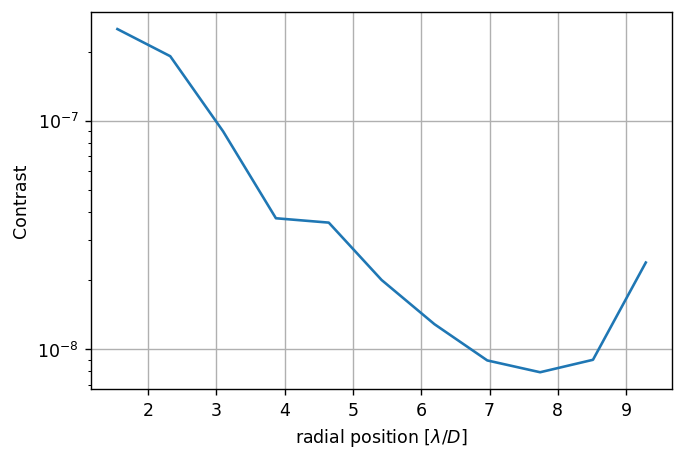

	Closed-loop iteration 5 / 10


(984,)

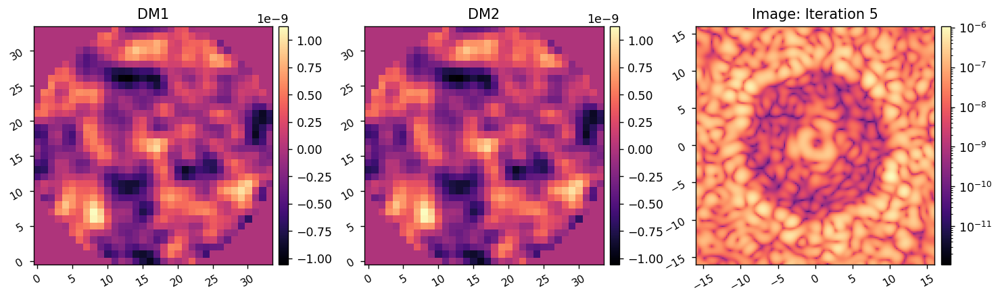

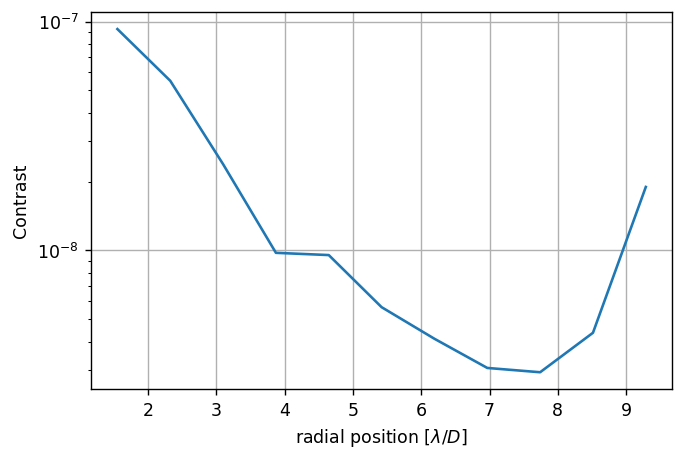

	Closed-loop iteration 6 / 10


(984,)

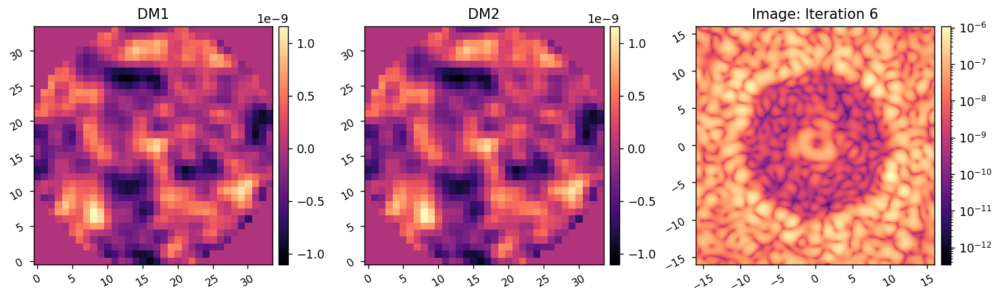

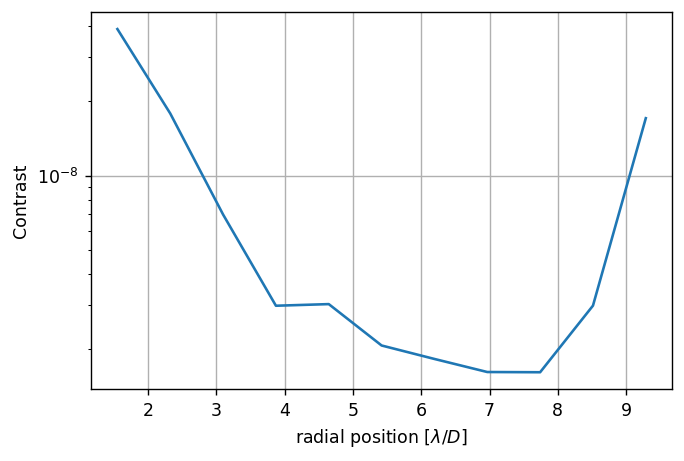

	Closed-loop iteration 7 / 10


(984,)

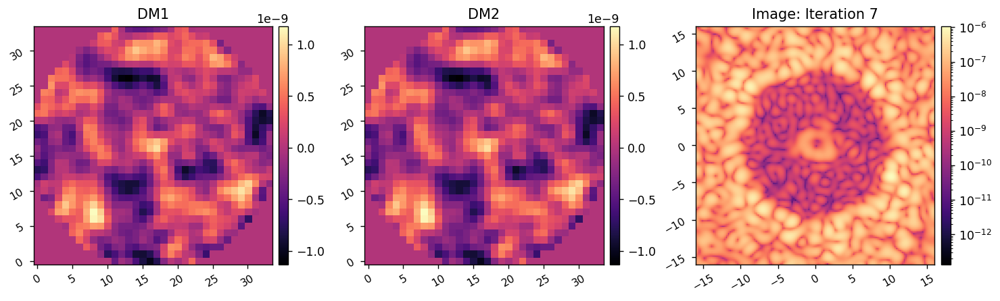

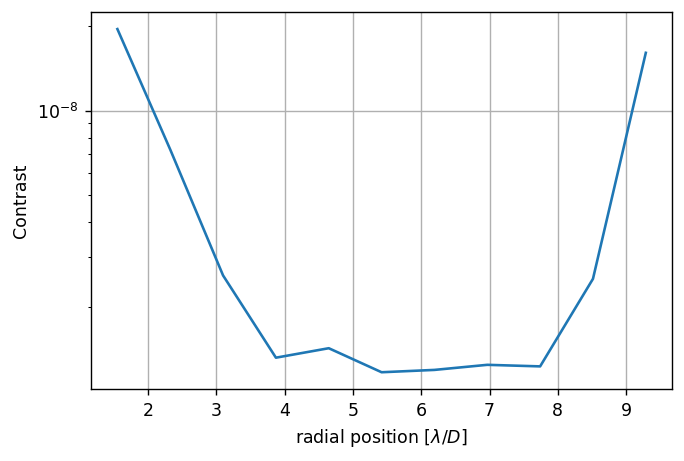

	Closed-loop iteration 8 / 10


(984,)

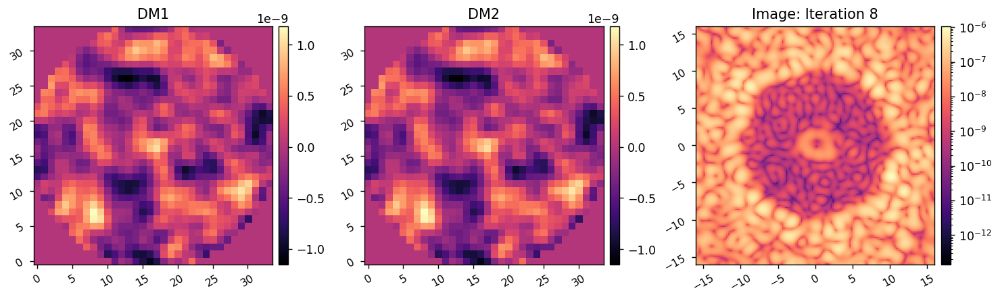

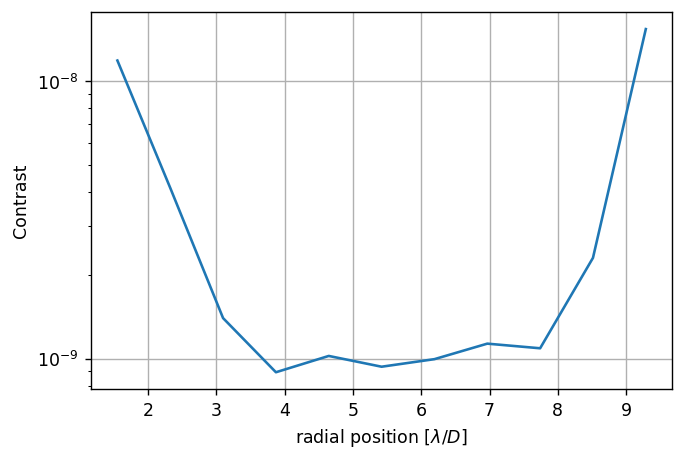

	Closed-loop iteration 9 / 10


(984,)

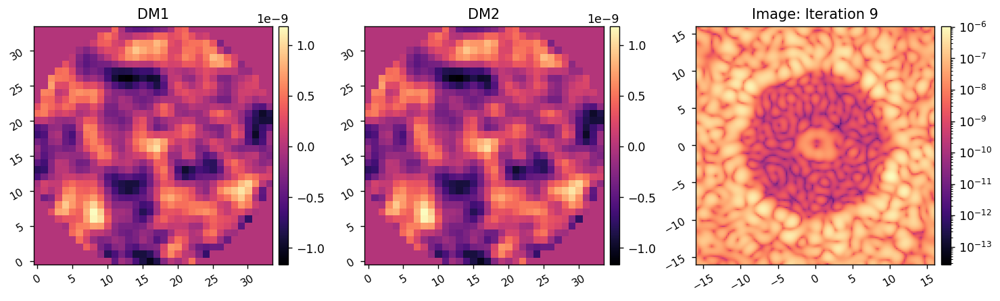

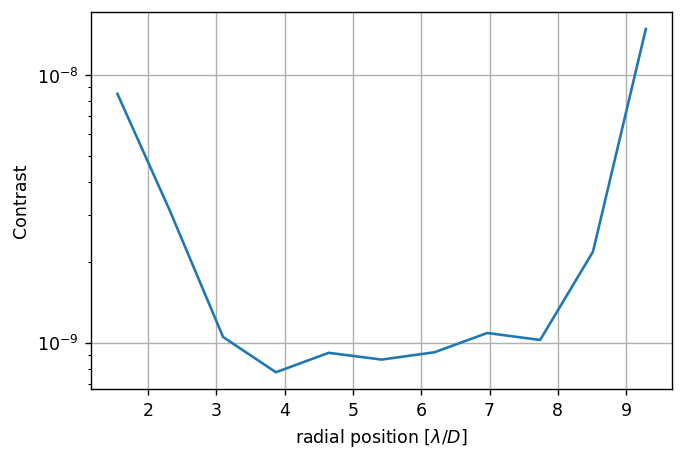

	Closed-loop iteration 10 / 10


(984,)

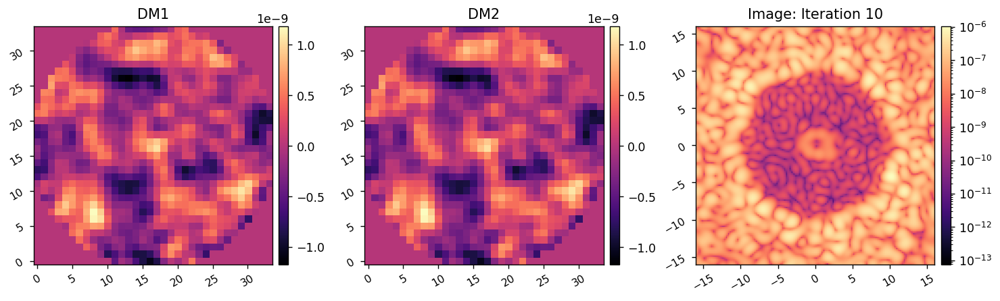

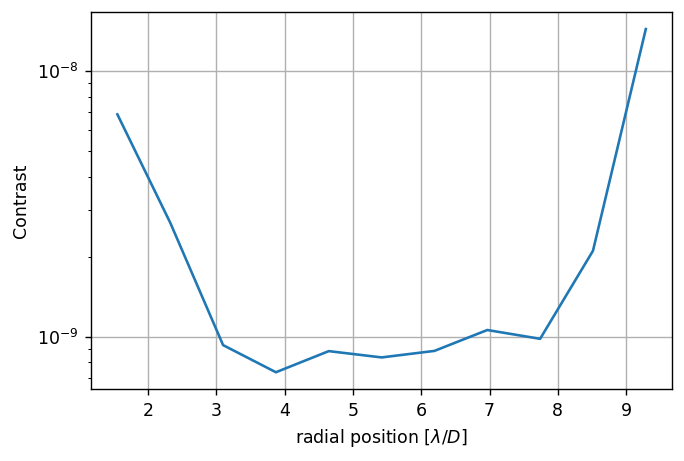

I-EFC loop completed in 31.901s.
Running I-EFC...
	Closed-loop iteration 1 / 20


(984,)

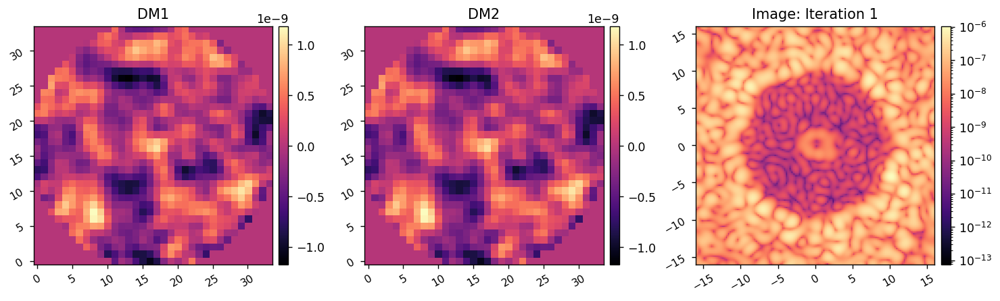

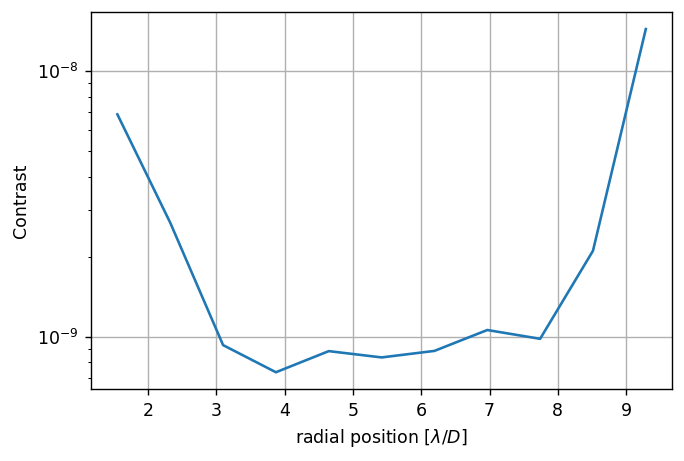

	Closed-loop iteration 2 / 20


(984,)

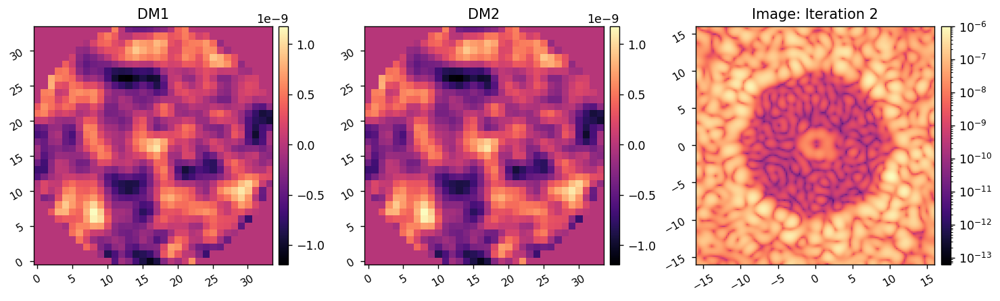

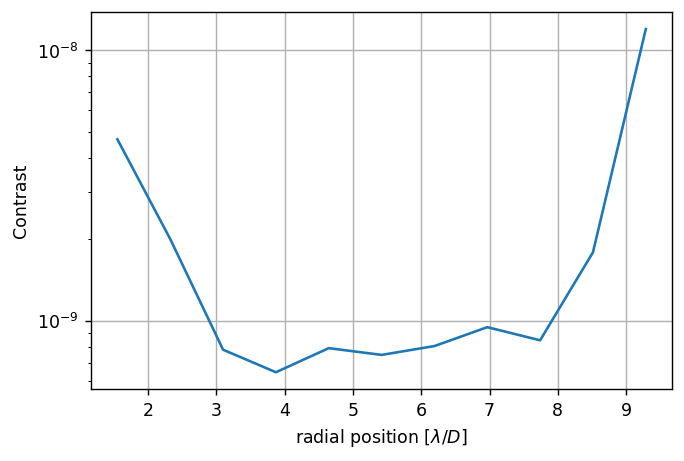

	Closed-loop iteration 3 / 20


(984,)

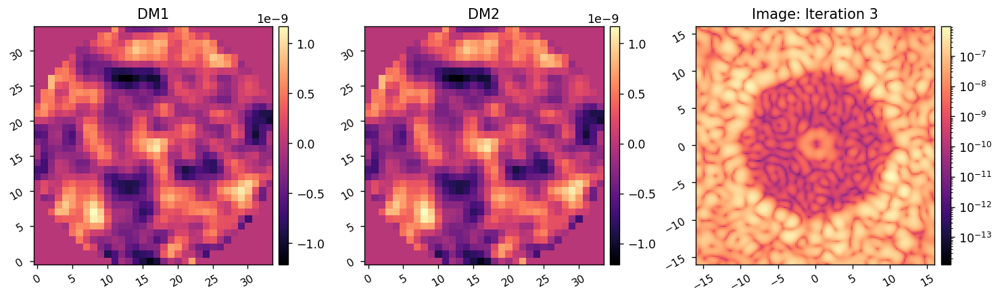

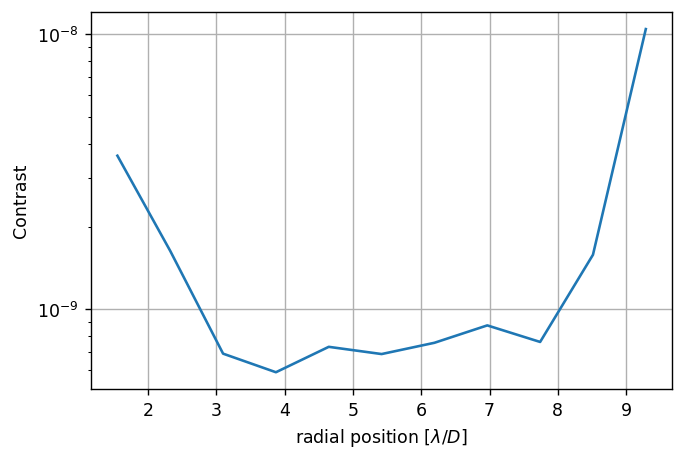

	Closed-loop iteration 4 / 20


(984,)

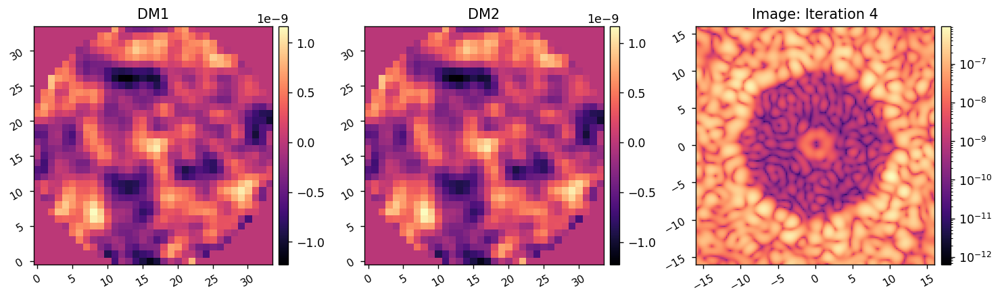

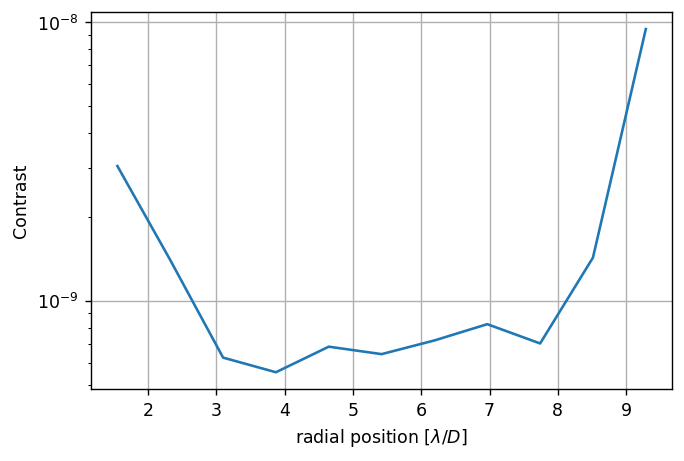

	Closed-loop iteration 5 / 20


(984,)

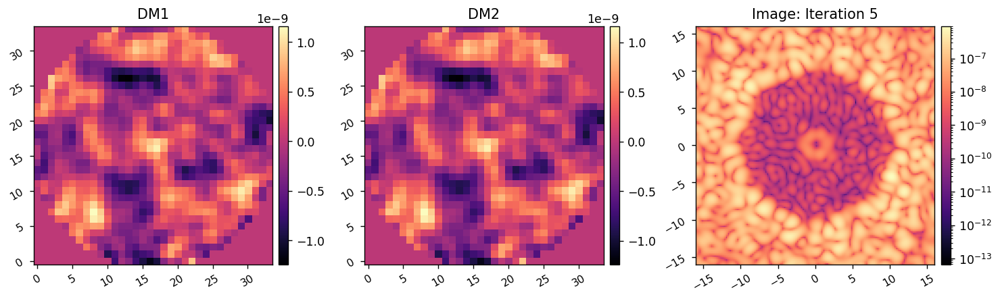

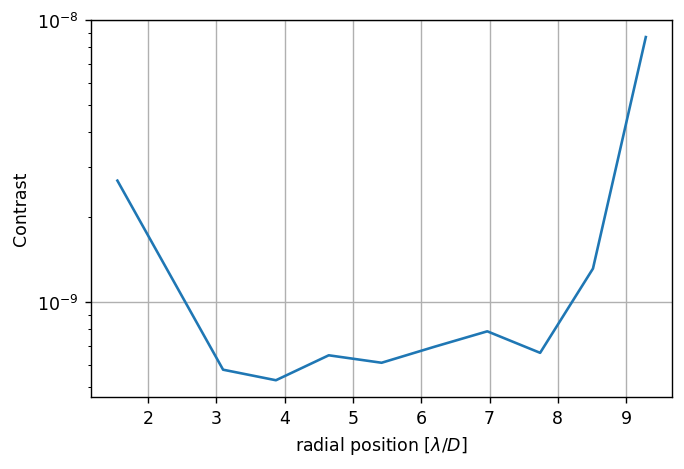

	Closed-loop iteration 6 / 20


(984,)

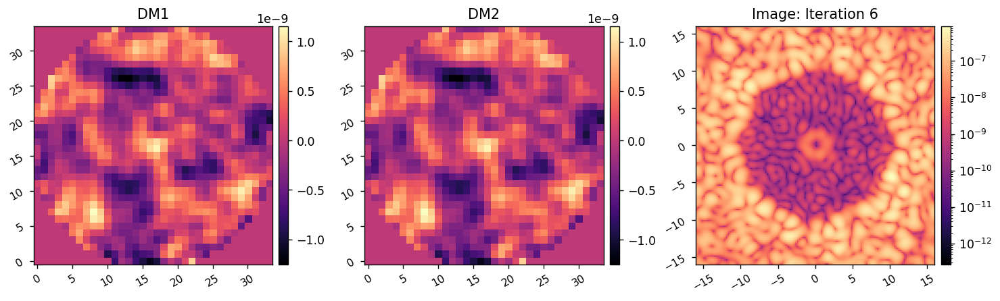

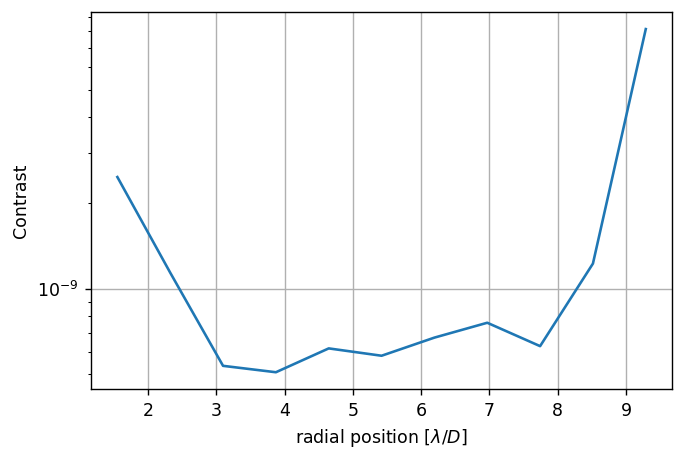

	Closed-loop iteration 7 / 20


(984,)

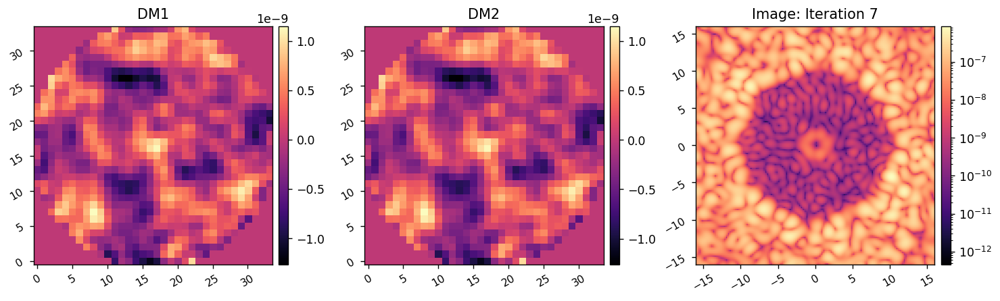

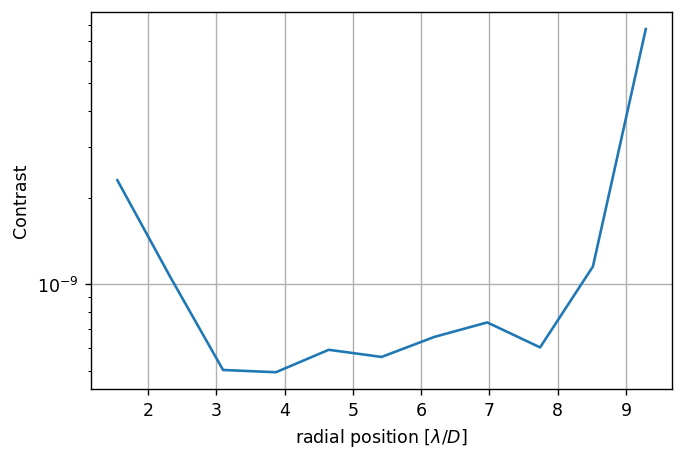

	Closed-loop iteration 8 / 20


(984,)

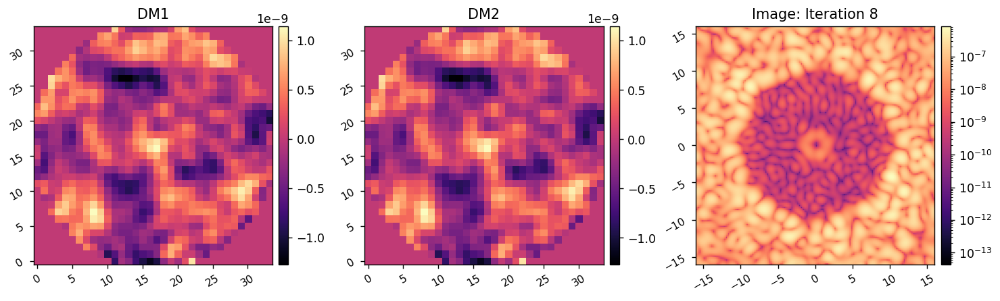

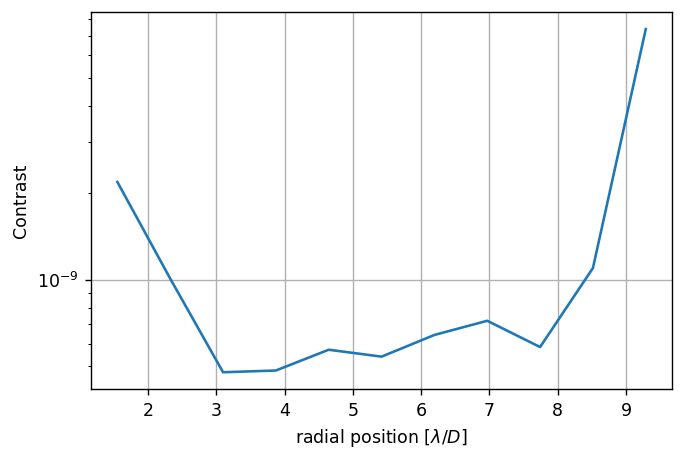

	Closed-loop iteration 9 / 20


(984,)

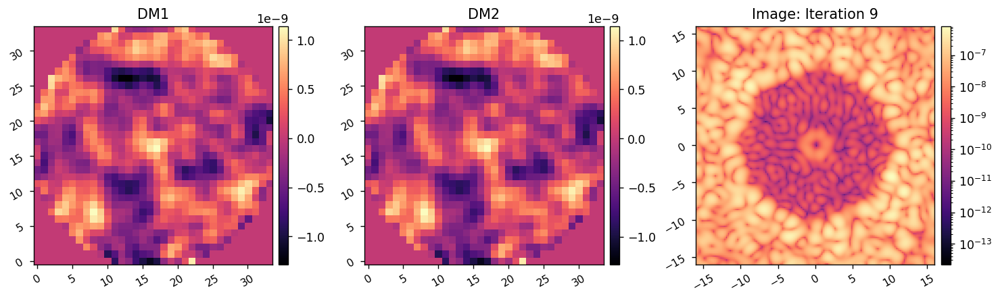

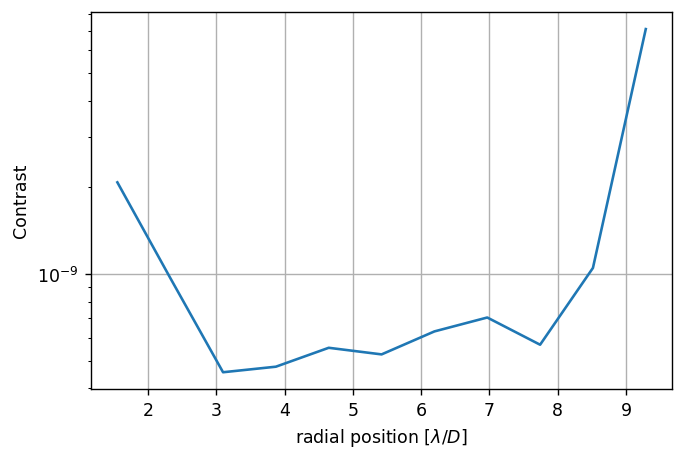

	Closed-loop iteration 10 / 20


(984,)

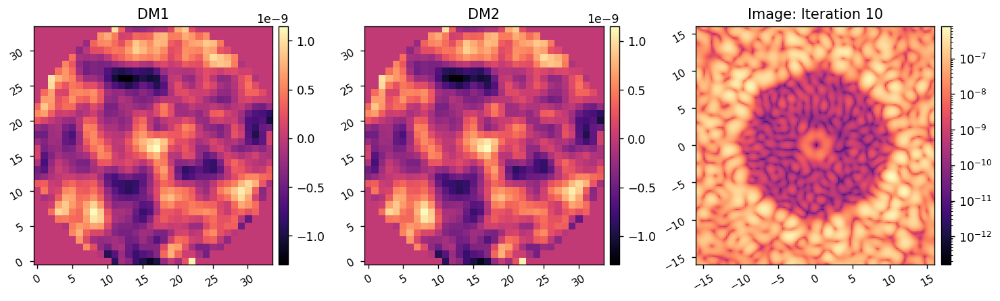

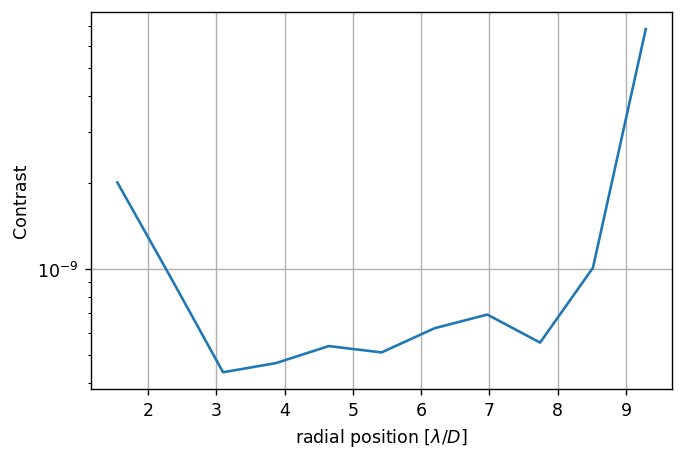

	Closed-loop iteration 11 / 20


(984,)

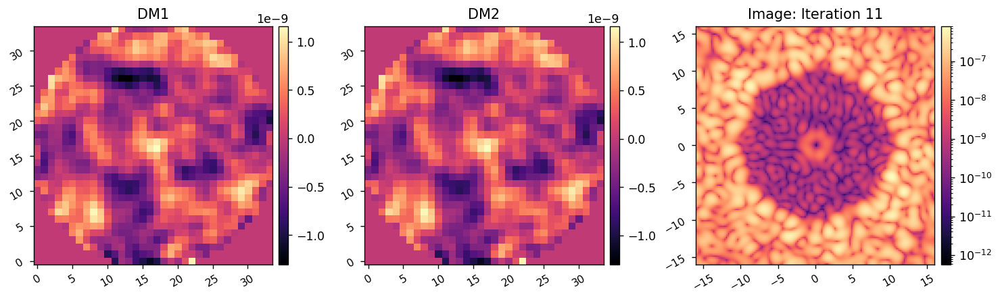

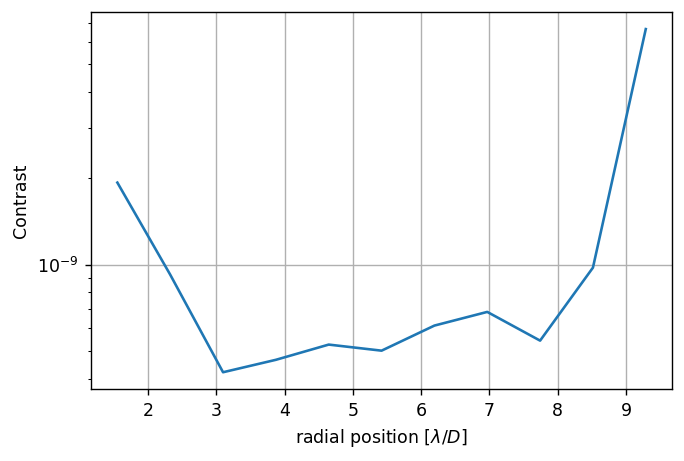

	Closed-loop iteration 12 / 20


(984,)

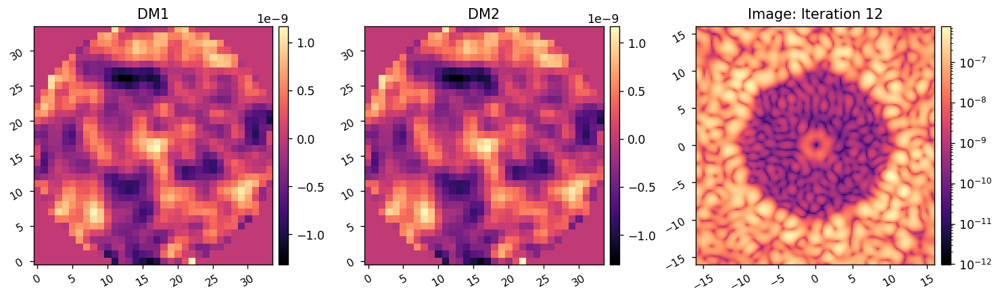

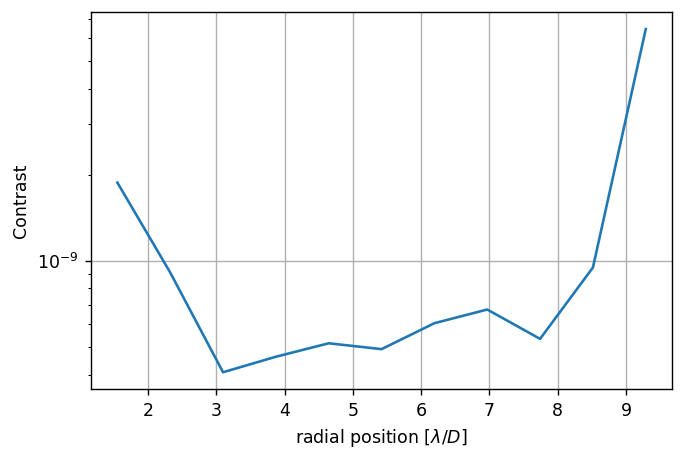

	Closed-loop iteration 13 / 20


(984,)

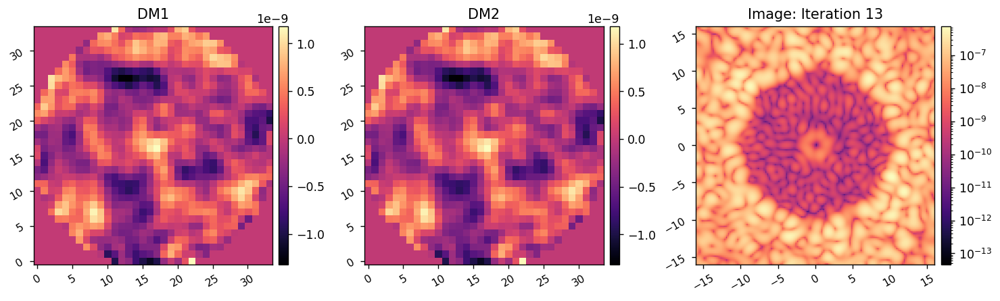

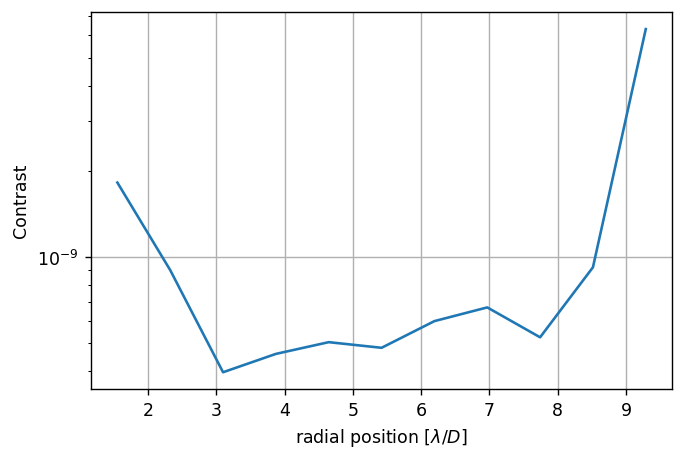

	Closed-loop iteration 14 / 20


(984,)

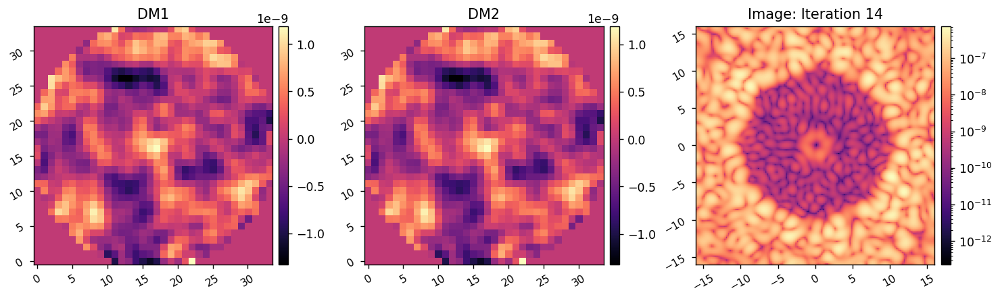

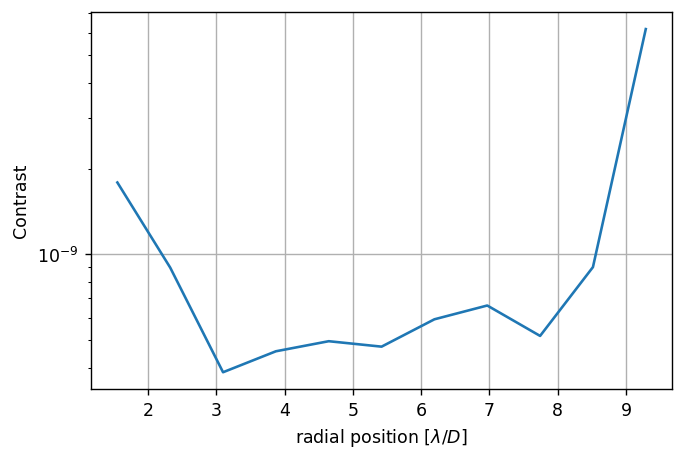

	Closed-loop iteration 15 / 20


(984,)

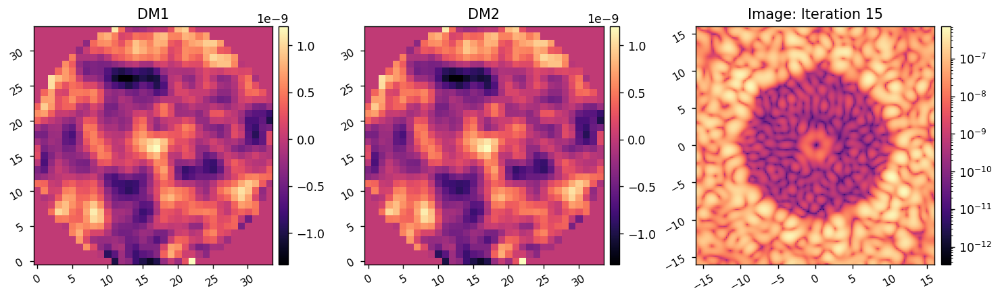

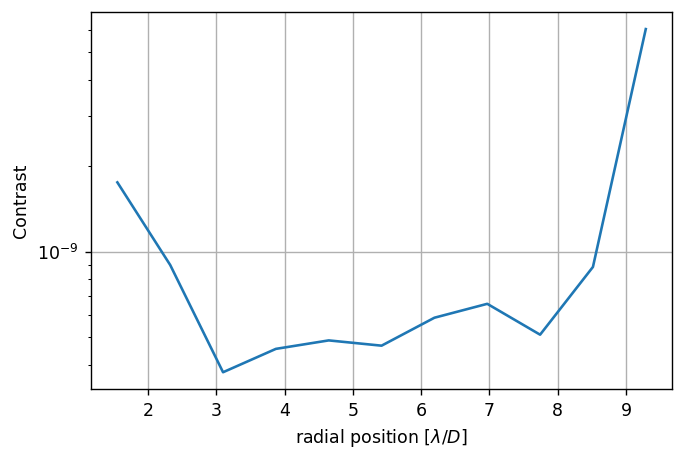

	Closed-loop iteration 16 / 20


(984,)

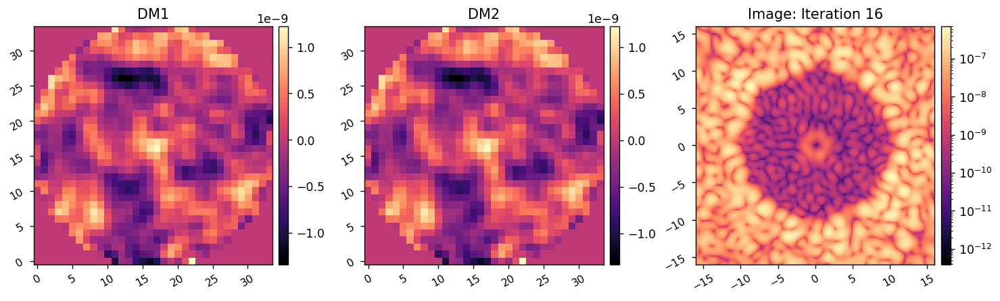

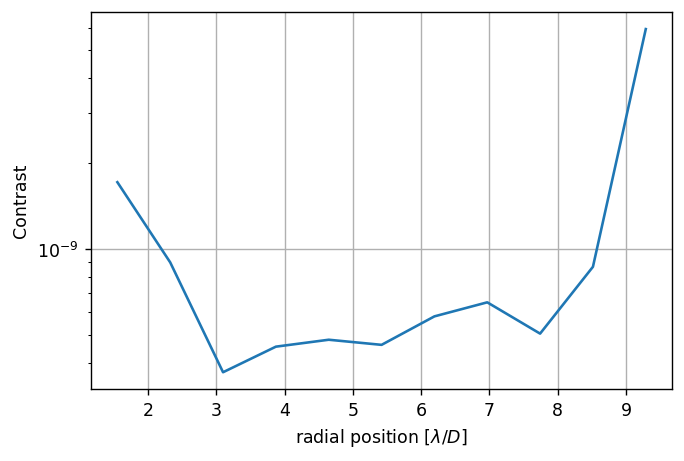

	Closed-loop iteration 17 / 20


(984,)

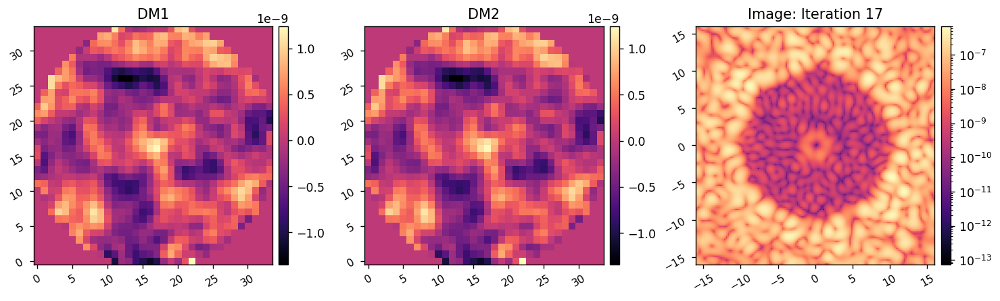

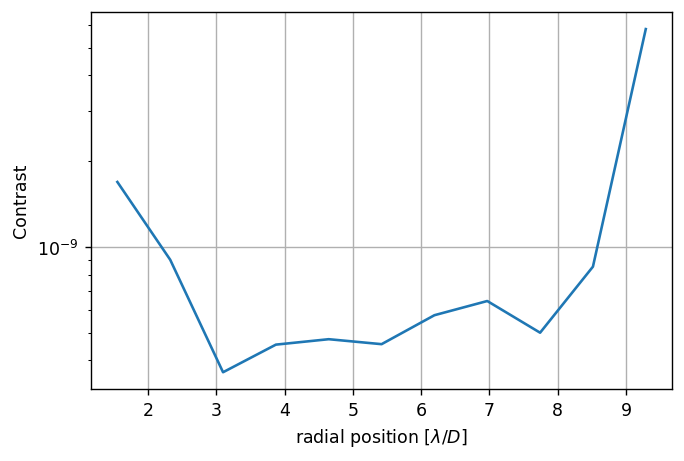

	Closed-loop iteration 18 / 20


(984,)

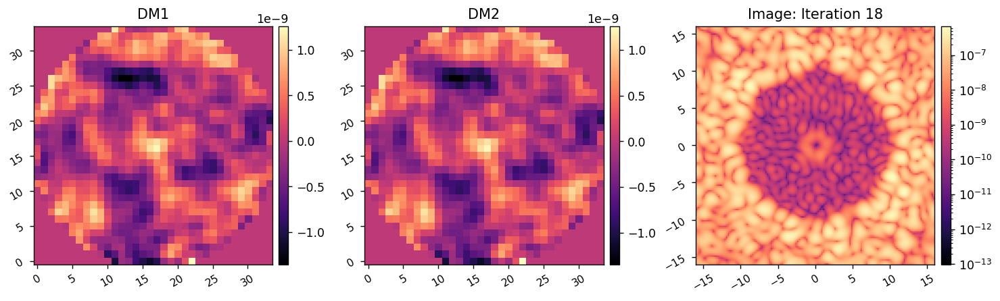

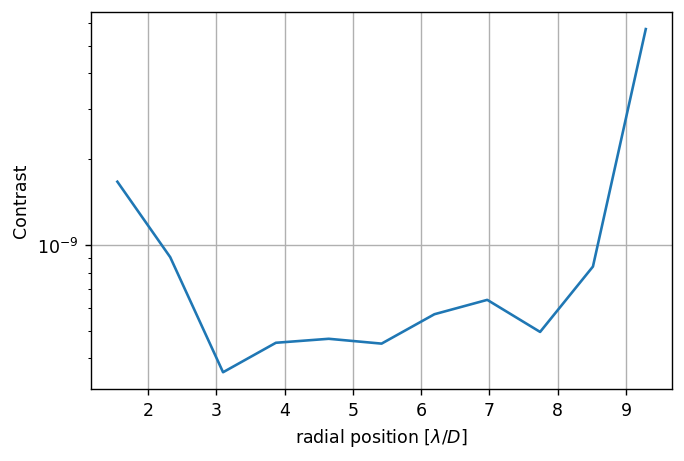

	Closed-loop iteration 19 / 20


(984,)

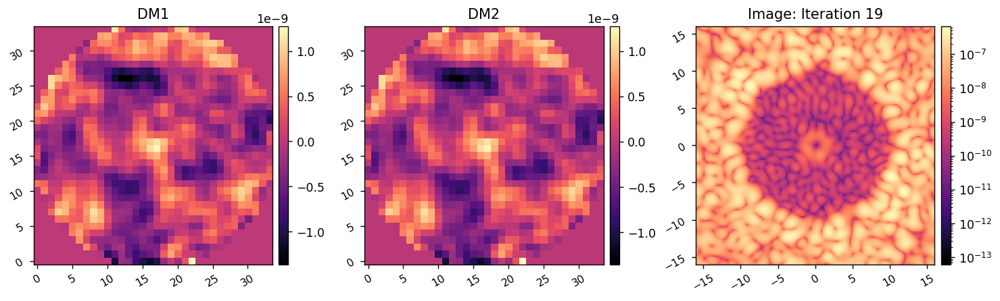

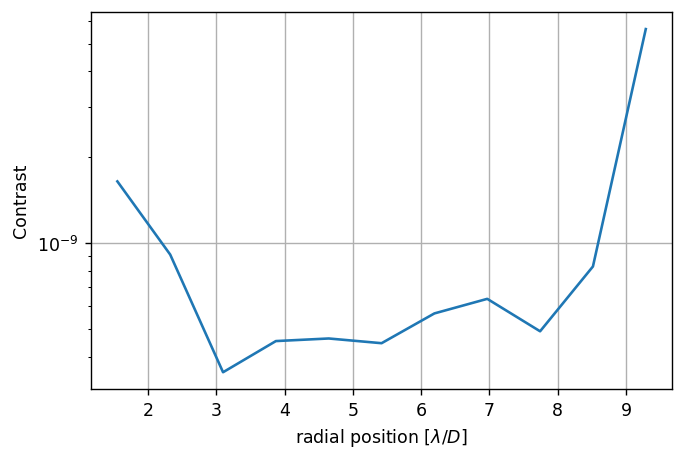

	Closed-loop iteration 20 / 20


(984,)

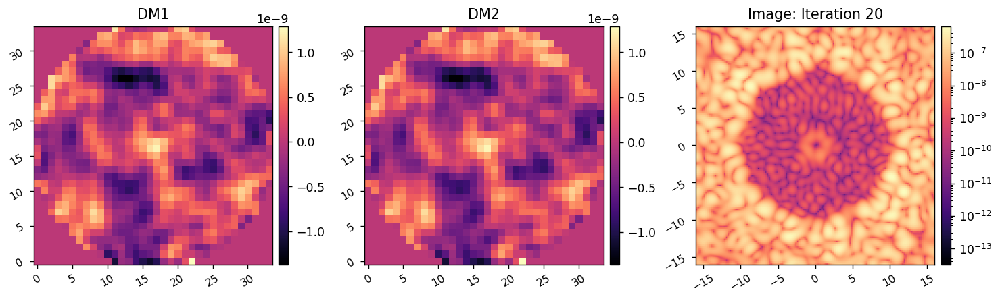

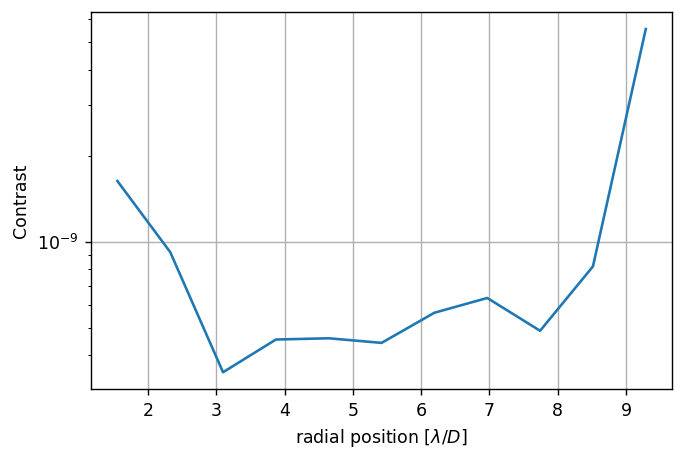

I-EFC loop completed in 62.904s.
Running I-EFC...
	Closed-loop iteration 1 / 20


(984,)

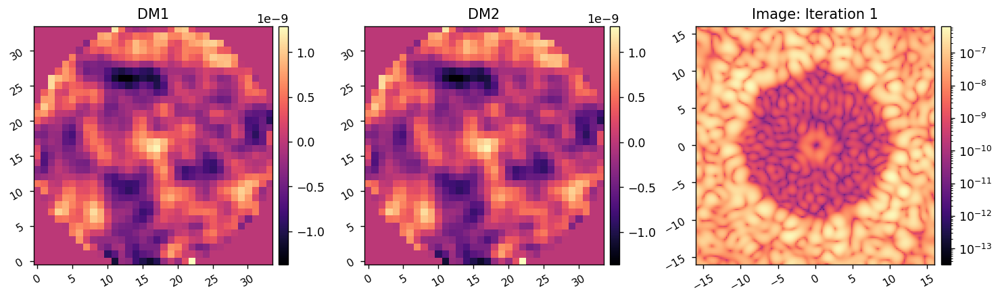

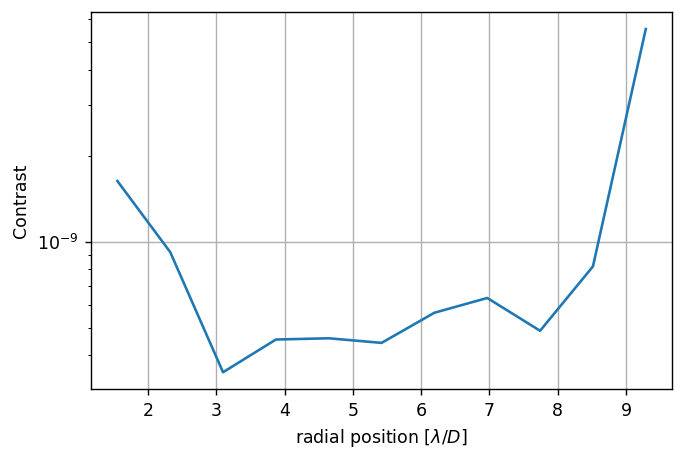

	Closed-loop iteration 2 / 20


(984,)

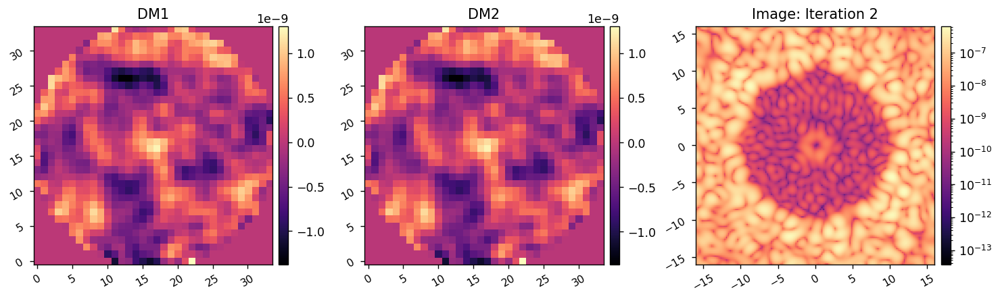

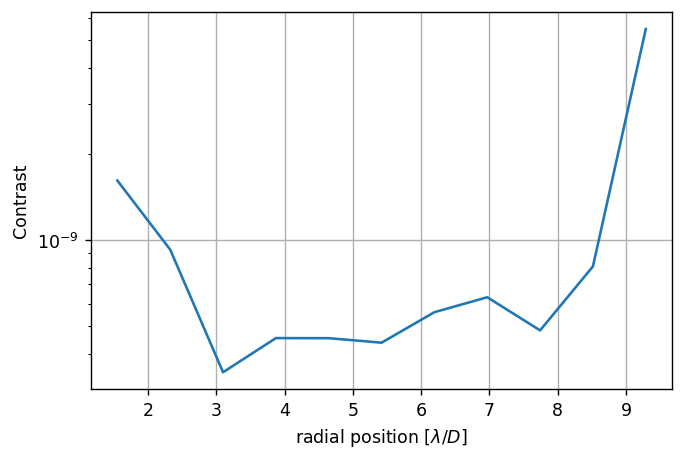

	Closed-loop iteration 3 / 20


(984,)

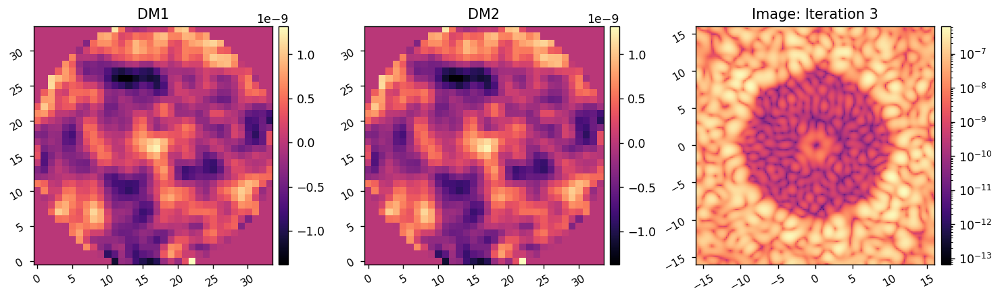

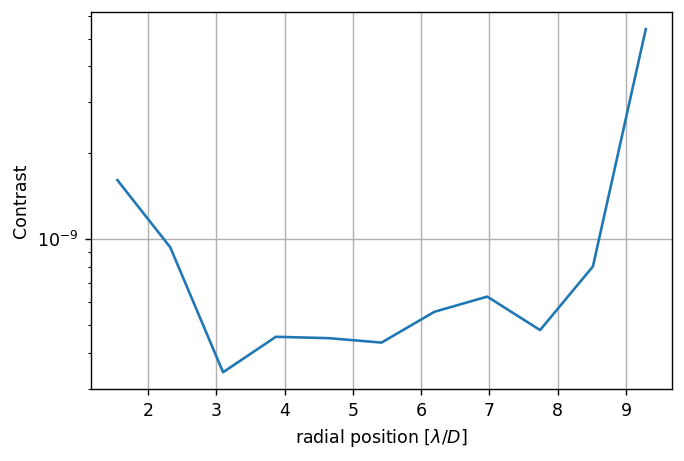

	Closed-loop iteration 4 / 20


(984,)

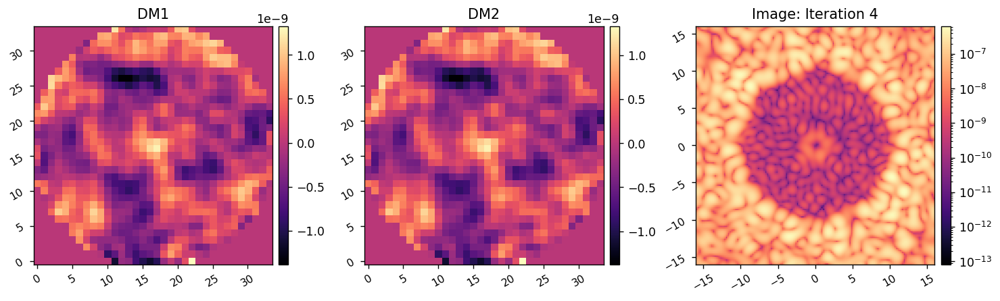

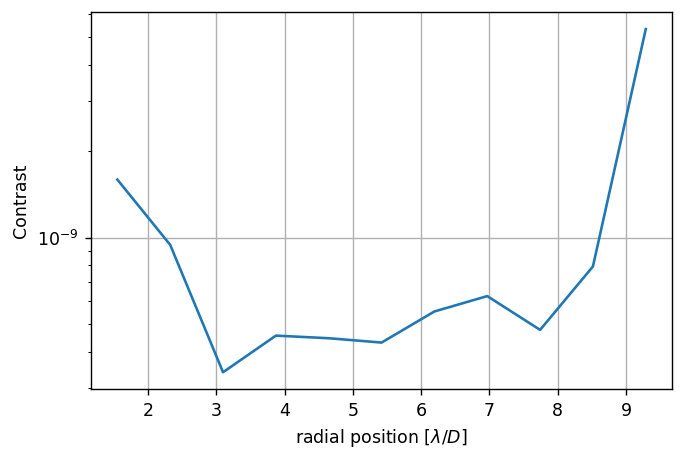

	Closed-loop iteration 5 / 20


(984,)

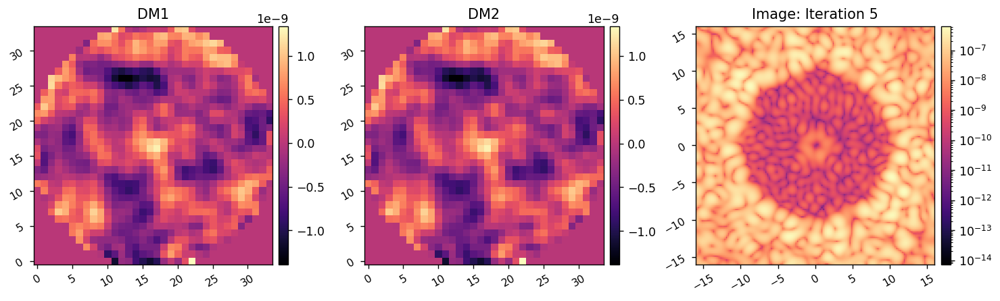

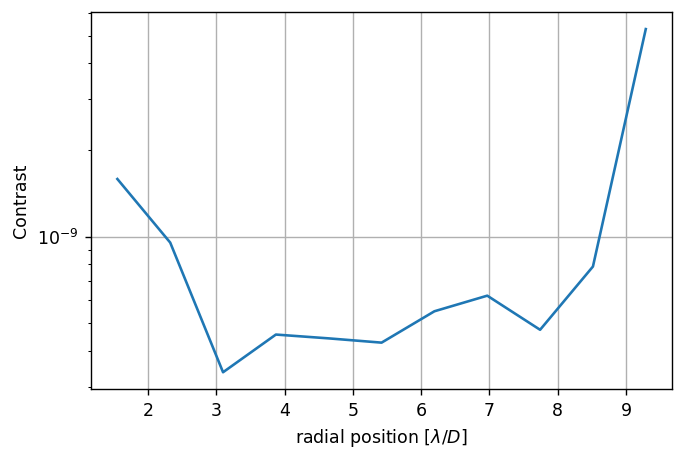

	Closed-loop iteration 6 / 20


(984,)

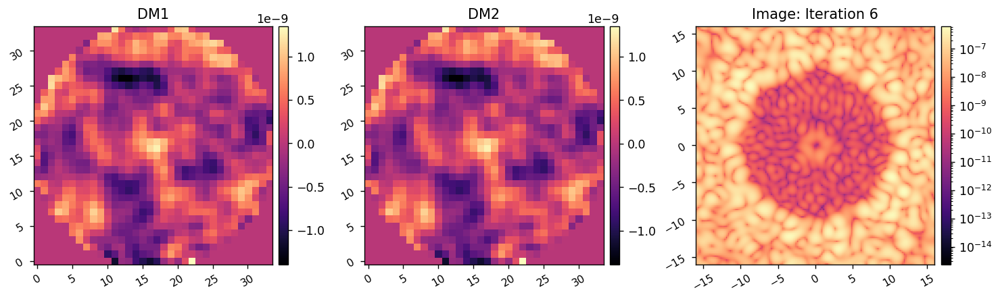

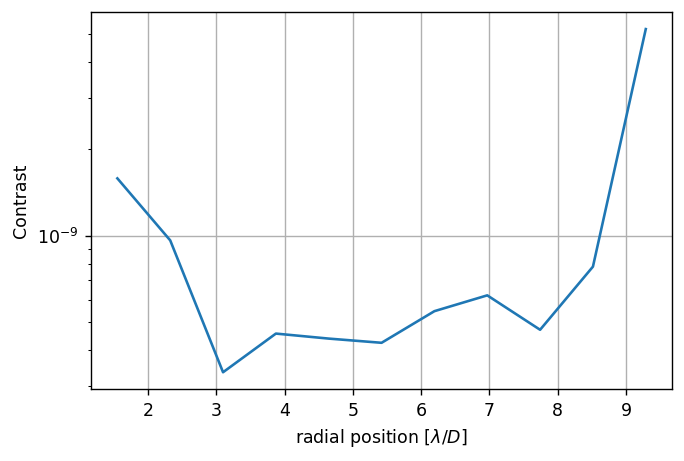

	Closed-loop iteration 7 / 20


(984,)

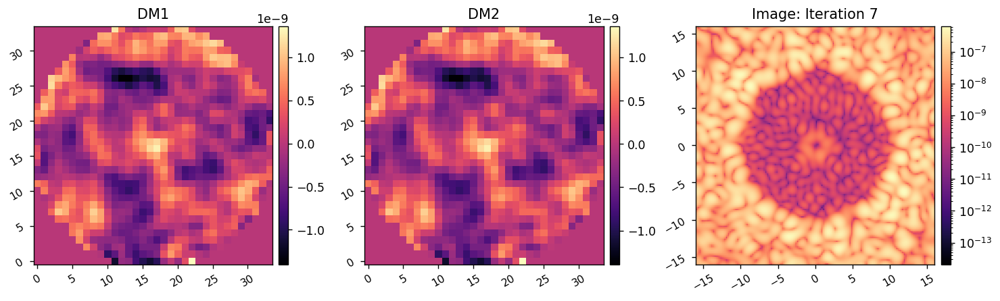

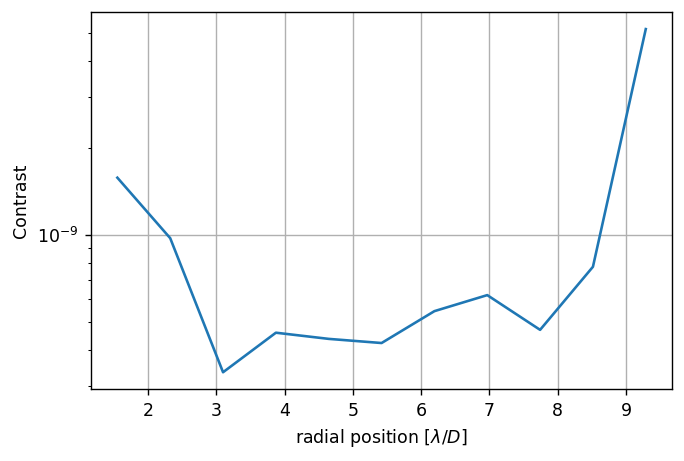

	Closed-loop iteration 8 / 20


(984,)

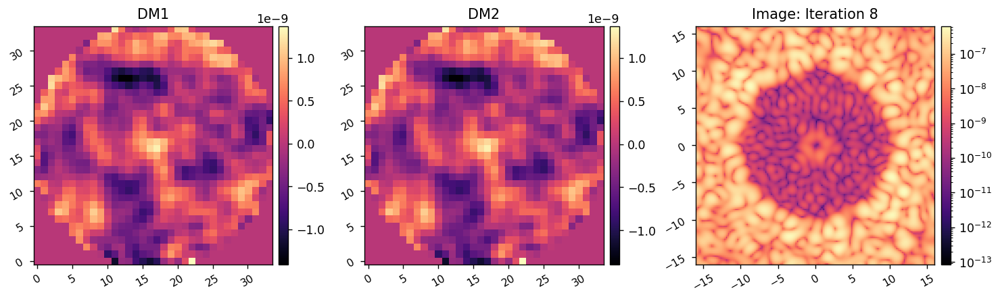

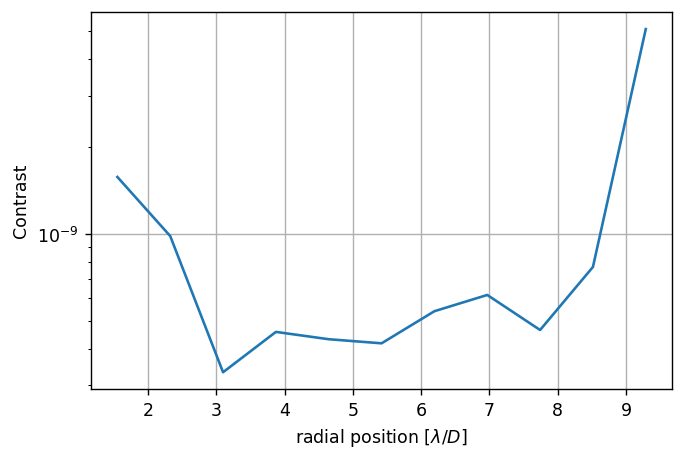

	Closed-loop iteration 9 / 20


(984,)

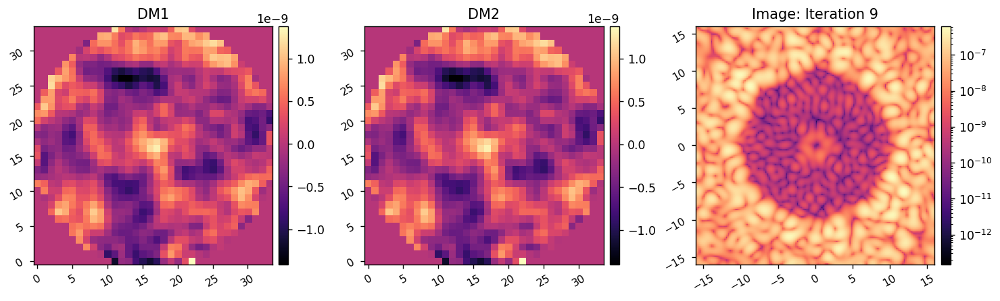

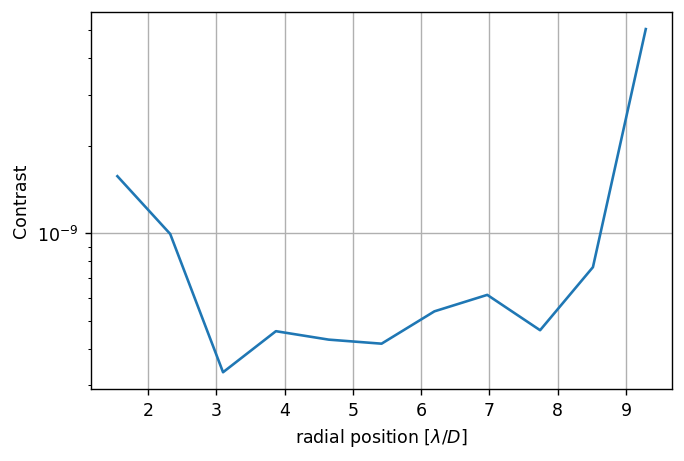

	Closed-loop iteration 10 / 20


(984,)

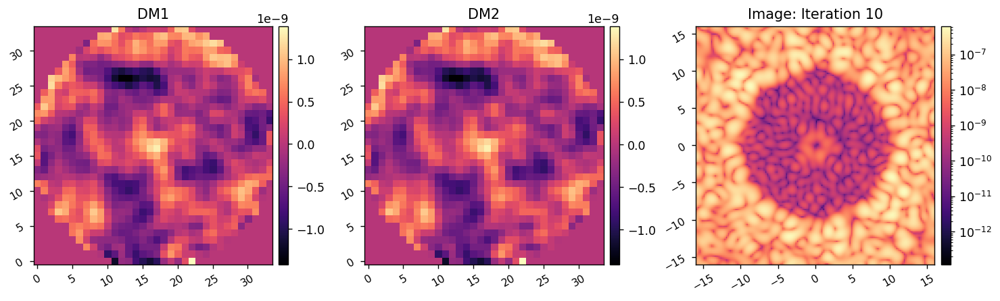

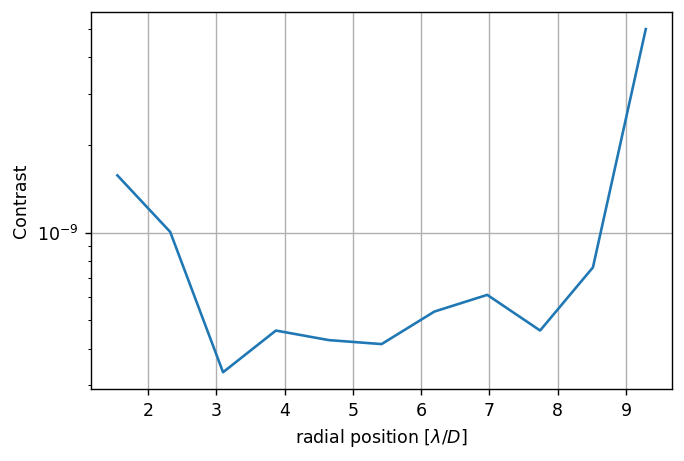

	Closed-loop iteration 11 / 20


(984,)

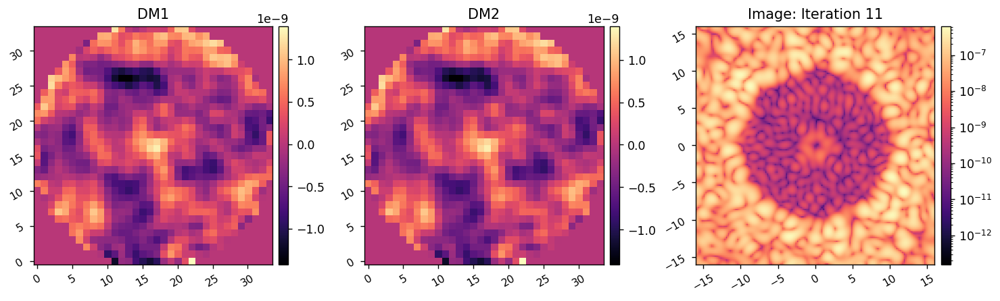

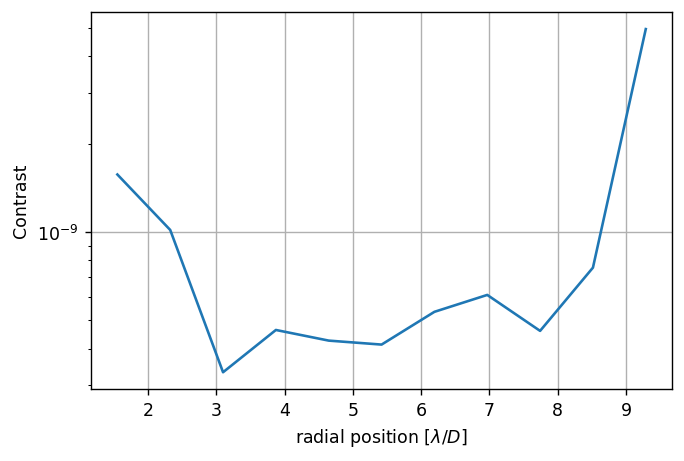

	Closed-loop iteration 12 / 20


(984,)

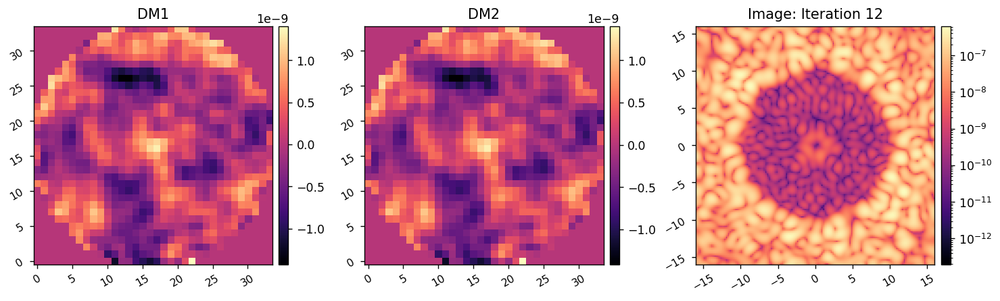

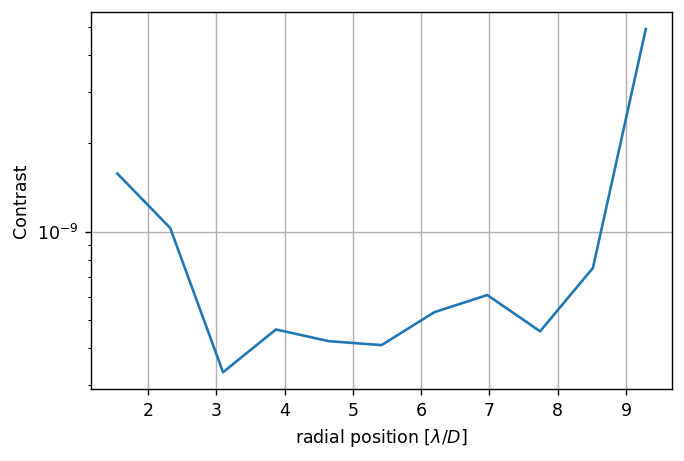

	Closed-loop iteration 13 / 20


(984,)

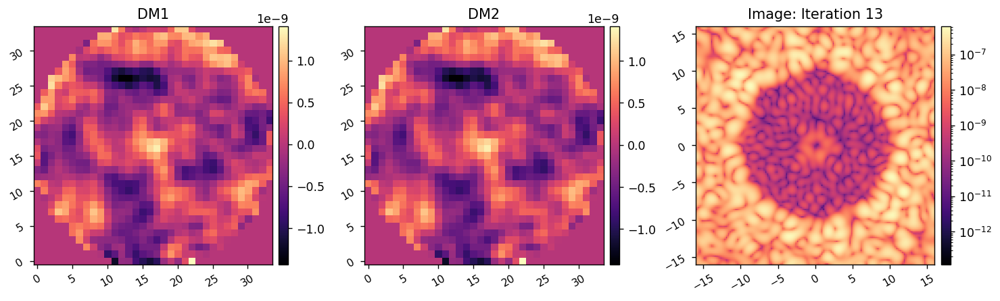

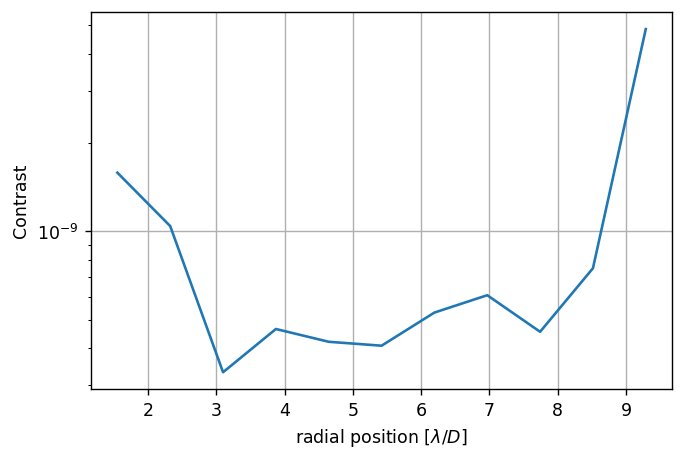

	Closed-loop iteration 14 / 20


(984,)

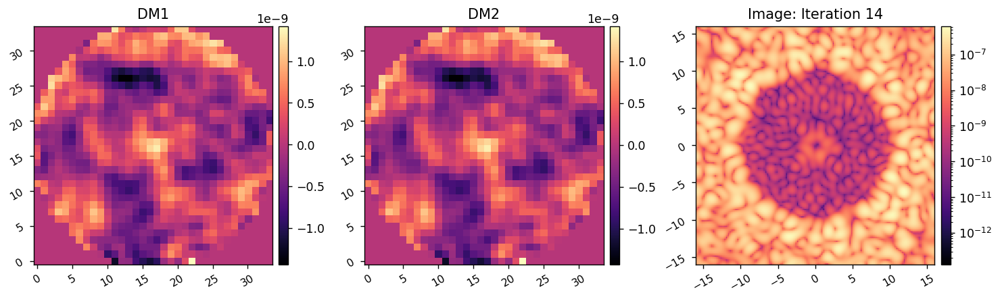

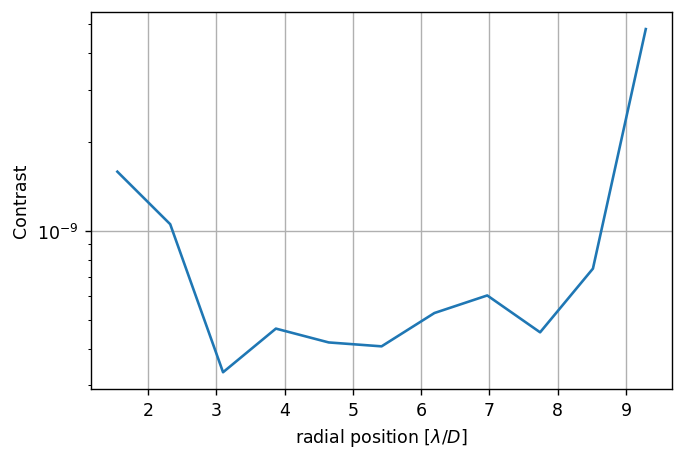

	Closed-loop iteration 15 / 20


(984,)

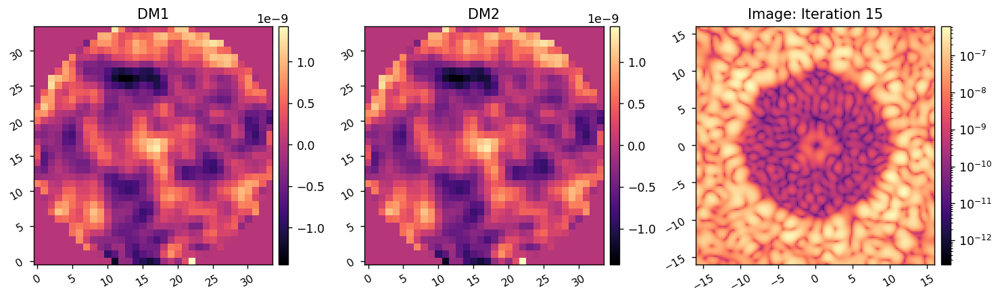

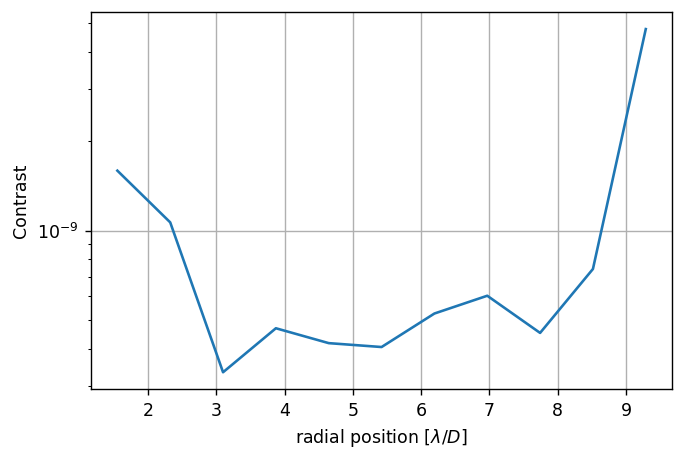

	Closed-loop iteration 16 / 20


(984,)

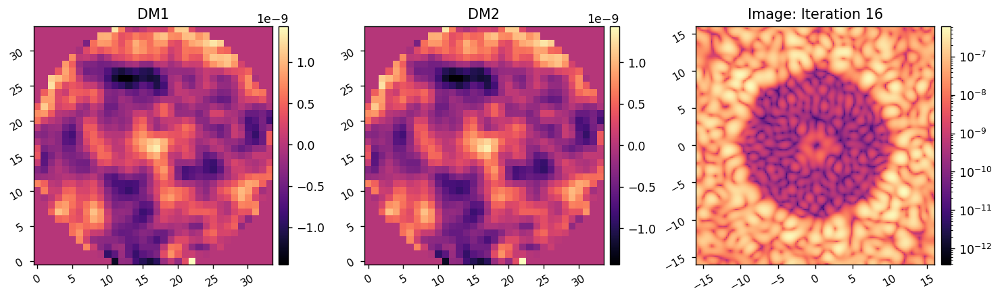

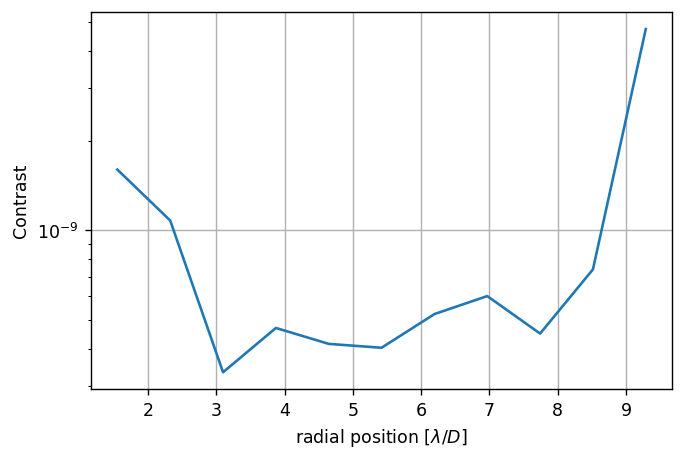

	Closed-loop iteration 17 / 20


(984,)

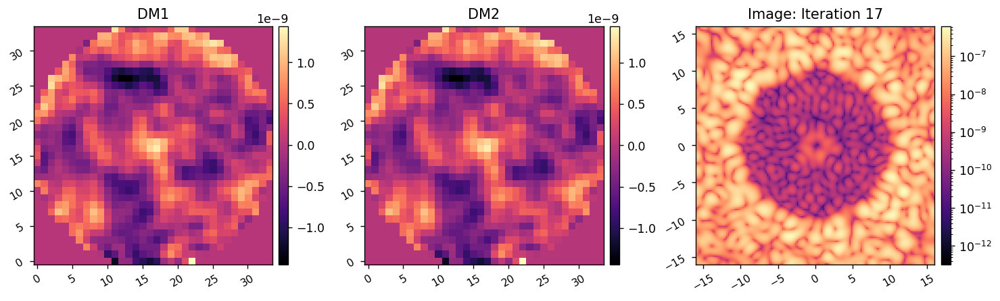

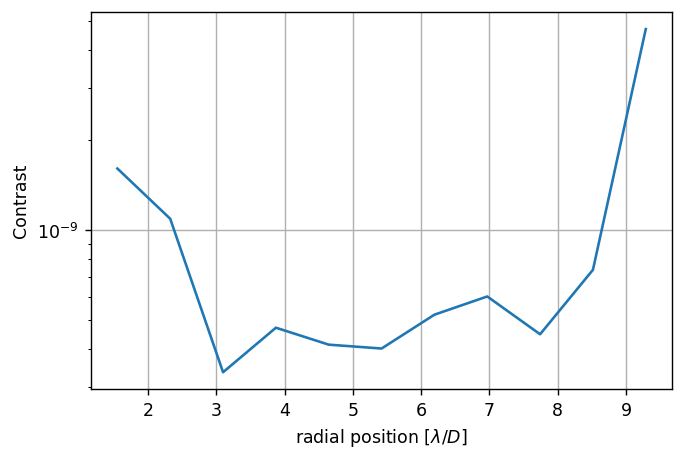

	Closed-loop iteration 18 / 20


(984,)

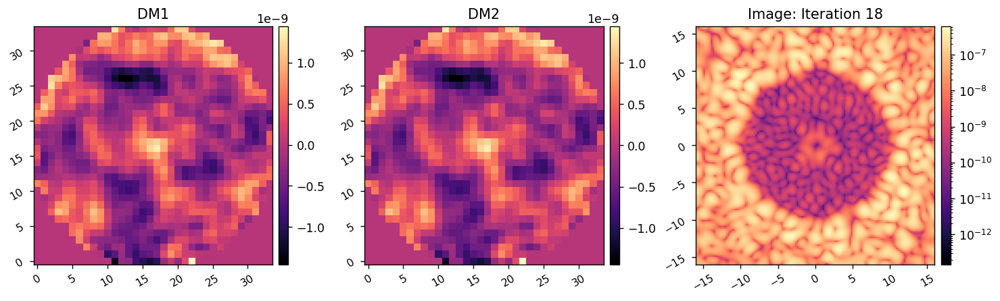

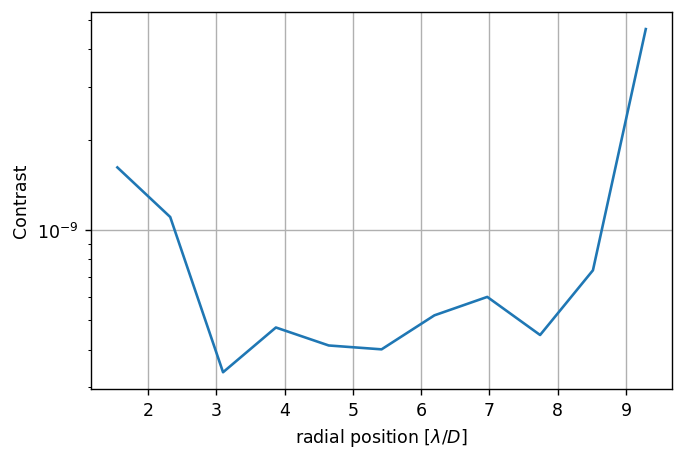

	Closed-loop iteration 19 / 20


(984,)

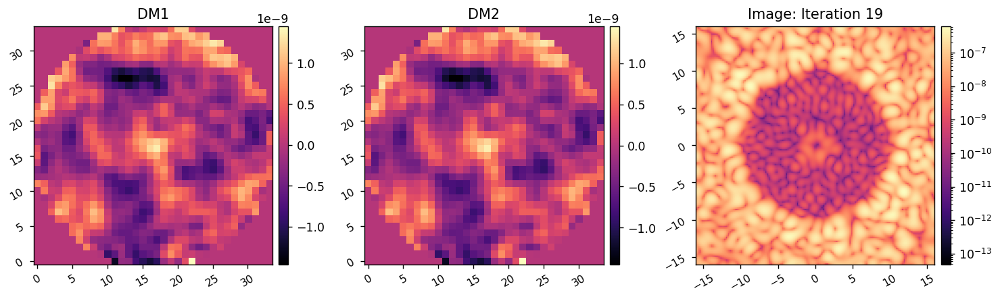

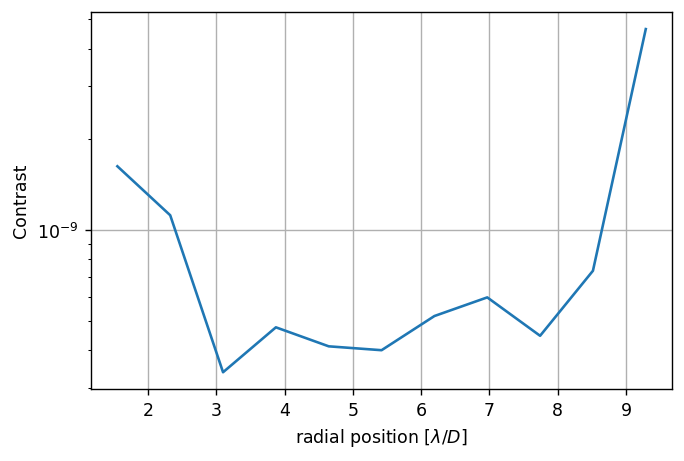

	Closed-loop iteration 20 / 20


(984,)

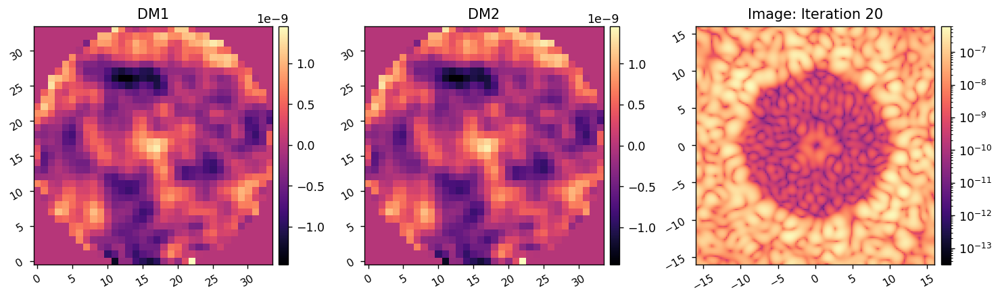

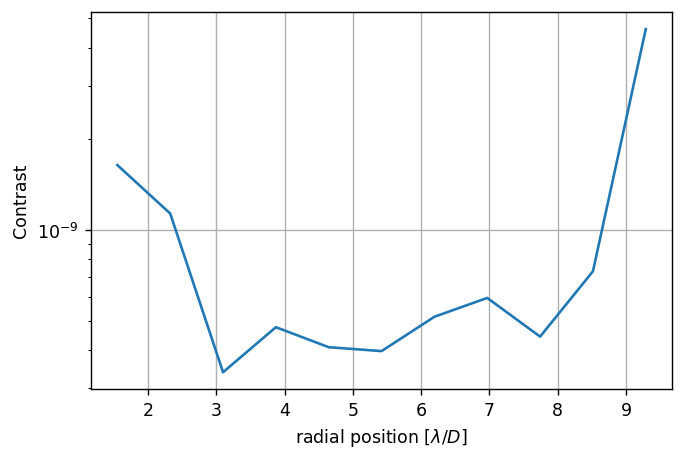

I-EFC loop completed in 62.767s.


In [72]:
reload(wfsc.iefc_2dm)
reload(wfsc.utils)

c.reset_dms()

reg_conds = [(1e-2,10), (1e-3, 20), (1e-3, 20)]

Wmatrix = np.diag(np.concatenate((weight_map[control_mask], weight_map[control_mask], weight_map[control_mask])))

for i in range(len(reg_conds)):
    
#     cm_tik = wfsc.utils.TikhonovInverse(response_matrix, rcond=reg_conds[i][0])
    cm_wls = wfsc.utils.WeightedLeastSquares(response_matrix, Wmatrix, rcond=reg_conds[i][0])
    
    images, dm1_commands, dm2_commands = wfsc.iefc_2dm.run(c, 
                                              cm_wls,
                                              probe_modes, 
                                              probe_amp, 
                                              fourier_modes,
                                              control_mask, 
                                              num_iterations=reg_conds[i][1], 
                                              loop_gain=0.5, 
                                              leakage=0.0,
                                              plot_all=True,
                                             )